## PROJECT (4)
### MATHEMATICAL FOUNDATION OF DATA SCIENCE- CH5019

#### NAME: KRISHNA SAH TELI
#### ROLL NO: GE22MO18


Problem Statement:

The pollutant that affects people the most is particulate matter, usually abbreviated as PM and used as a measure of air pollution. Although particles with a diameter of 10 microns or less (≤PM10) can penetrate and embed deep in the lungs, the ones that are more harmful to health are those with a diameter of 2.5 microns or less (≤PM2.5).

### Importing of Libraries

In [3]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from collections import Counter
import glob
import statistics

# ignore warnings
import warnings
warnings.filterwarnings("ignore")

### Loading of Dataset

In [26]:
filePath = 'D:\VS\JupyterNoteBook\MFD_Statistics\Project\Dataset'
allFiles = glob.glob(filePath + "/*.csv")
dataFrames = []
for i in allFiles:
    df = pd.read_csv(i, index_col=None, header=0)
    dataFrames.append(df)
data = pd.concat(dataFrames)


In [27]:
data.shape

(420768, 18)

In [14]:
print("We have " + str(len(data)) + " number of instances(rows) in our data set")


We have 420768 number of instances(rows) in our data set


In [28]:
data

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,1,2013,3,1,0,4.0,4.0,4.0,7.0,300.0,77.0,-0.7,1023.0,-18.8,0.0,NNW,4.4,Aotizhongxin
1,2,2013,3,1,1,8.0,8.0,4.0,7.0,300.0,77.0,-1.1,1023.2,-18.2,0.0,N,4.7,Aotizhongxin
2,3,2013,3,1,2,7.0,7.0,5.0,10.0,300.0,73.0,-1.1,1023.5,-18.2,0.0,NNW,5.6,Aotizhongxin
3,4,2013,3,1,3,6.0,6.0,11.0,11.0,300.0,72.0,-1.4,1024.5,-19.4,0.0,NW,3.1,Aotizhongxin
4,5,2013,3,1,4,3.0,3.0,12.0,12.0,300.0,72.0,-2.0,1025.2,-19.5,0.0,N,2.0,Aotizhongxin
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35059,35060,2017,2,28,19,11.0,32.0,3.0,24.0,400.0,72.0,12.5,1013.5,-16.2,0.0,NW,2.4,Wanshouxigong
35060,35061,2017,2,28,20,13.0,32.0,3.0,41.0,500.0,50.0,11.6,1013.6,-15.1,0.0,WNW,0.9,Wanshouxigong
35061,35062,2017,2,28,21,14.0,28.0,4.0,38.0,500.0,54.0,10.8,1014.2,-13.3,0.0,NW,1.1,Wanshouxigong
35062,35063,2017,2,28,22,12.0,23.0,4.0,30.0,400.0,59.0,10.5,1014.4,-12.9,0.0,NNW,1.2,Wanshouxigong


In [29]:
## Renaming the columns names and removing unwanted columns

data.drop(["No"], axis=1, inplace=True)
data.rename(columns = {'year': 'Year',
                       'month': 'Month',
                       'day': "Day",
                       'hour': 'Hour',
                       'pm2.5': 'PM2.5',
                       'DEWP': 'DewP',
                       'TEMP': 'Temp',
                       'PRES': 'Press',
                       'RAIN': 'Rain',
                       'wd': 'WinDir',
                       'WSPM': 'WinSpeed',
                       'station': 'Station'}, inplace = True)

#### Info Method

Before start our discovery of the data, let's first trying know if there are some nan values in our data or not, to get everything stable when we start our analysis to the data.

So from that point we can use info method, which give us overview about the data overall from size, to number of instances, beside of that each column data type, number of non-null values(which is our interest now).

In [17]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 420768 entries, 0 to 35063
Data columns (total 17 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   Year      420768 non-null  int64  
 1   Month     420768 non-null  int64  
 2   Day       420768 non-null  int64  
 3   Hour      420768 non-null  int64  
 4   PM2.5     412029 non-null  float64
 5   PM10      414319 non-null  float64
 6   SO2       411747 non-null  float64
 7   NO2       408652 non-null  float64
 8   CO        400067 non-null  float64
 9   O3        407491 non-null  float64
 10  Temp      420370 non-null  float64
 11  Press     420375 non-null  float64
 12  DewP      420365 non-null  float64
 13  Rain      420378 non-null  float64
 14  WinDir    418946 non-null  object 
 15  WinSpeed  420450 non-null  float64
 16  Station   420768 non-null  object 
dtypes: float64(11), int64(4), object(2)
memory usage: 57.8+ MB


### Data Cleaning

In [30]:
data.isnull().sum()

Year            0
Month           0
Day             0
Hour            0
PM2.5        8739
PM10         6449
SO2          9021
NO2         12116
CO          20701
O3          13277
Temp          398
Press         393
DewP          403
Rain          390
WinDir       1822
WinSpeed      318
Station         0
dtype: int64

Here we can see there are many null values in different columns. Hence we will fix this null values using the statistical value with respect to the feature or column

##### For Numerical columns

In [31]:
# numerical columns having null values

columns_nan = ["PM2.5", 'PM10', 'SO2', 'NO2', 'CO', 'O3', 'Temp', 'Press', 'DewP', 'Rain', 'WinSpeed']

Here I have updated the columns nan values with the average value of month of the year to which nan belongs. It helps to maximize the realistic value.

In [32]:
unique_Year= pd.unique(data.Year)
unique_Month = pd.unique(data.Month)

temp_data = data.copy()  # set temp_data variable to avoid losing real data
for year in unique_Year:
    Yearly_filtered_data= temp_data[temp_data.Year==year]

    for month in unique_Month:        
        # filter data by Month
        monthly_fitered_data = Yearly_filtered_data[Yearly_filtered_data.Month== month]
        
        # find average for PM2_5 in specific to Month
        for col in columns_nan:
            mean = np.round(np.mean(monthly_fitered_data[col]), 2)
            monthly_fitered_data[col] = monthly_fitered_data[col].fillna(mean)
            #print(f"Missing Value in {col} column got filled with {mean} when Year :{year} and Month :{month}")
            
        # updating  
        Yearly_filtered_data[Yearly_filtered_data.Month== month]= monthly_fitered_data
    temp_data[temp_data.Year==year]= Yearly_filtered_data        
        #temp_data[[temp_data.Year== year & temp_data.Month== month]] = monthly_fitered_data
    
# equate the deprecated temporary data to the real data variable
clean_data = temp_data.copy() 

In [33]:
clean_data.isna().sum()

Year           0
Month          0
Day            0
Hour           0
PM2.5          0
PM10           0
SO2            0
NO2            0
CO             0
O3             0
Temp           0
Press          0
DewP           0
Rain           0
WinDir      1822
WinSpeed       0
Station        0
dtype: int64

##### For Categorical columns

In [34]:
unique_Station = pd.unique(data.Station)
temp_data = clean_data.copy()  # set temp_data variable to avoid losing real data
columns = ["WinDir"] 

for station in unique_Station:

    # filter data by Station
    filtered_data = temp_data[temp_data.Station == station]
    
    # find mode for WinDir specific to Station
    for column in columns:
        mode = statistics.mode(filtered_data[column])
        filtered_data[column] = filtered_data[column].fillna(mode)

    # Synchronize data filled with missing values in WinDir to data temporary            
    temp_data[temp_data.Station == station] = filtered_data

# equate the deprecated temporary data to the real data variable
clean_data = temp_data.copy() 

In [35]:
clean_data.isna().sum()

Year        0
Month       0
Day         0
Hour        0
PM2.5       0
PM10        0
SO2         0
NO2         0
CO          0
O3          0
Temp        0
Press       0
DewP        0
Rain        0
WinDir      0
WinSpeed    0
Station     0
dtype: int64

In [36]:
clean_data.to_csv('clean_data.csv')

### Data Analysis

In [5]:
df= clean_data.copy()

#### Adding a new column called Date

In [7]:
# creating date field for further analysis by extracting day of the week, month etc.
df['Date']=pd.to_datetime(df[['Year', 'Month', 'Day']])

In [8]:
df.head()

,Year,Month,Day,Hour,PM2.5,PM10,SO2,NO2,CO,O3,Temp,Press,DewP,Rain,WinDir,WinSpeed,Station,Date
0,2013,3,1,0,4.0,4.0,4.0,7.0,300.0,77.0,-0.7,1023.0,-18.8,0.0,NNW,4.4,Aotizhongxin,2013-03-01
1,2013,3,1,1,8.0,8.0,4.0,7.0,300.0,77.0,-1.1,1023.2,-18.2,0.0,N,4.7,Aotizhongxin,2013-03-01
2,2013,3,1,2,7.0,7.0,5.0,10.0,300.0,73.0,-1.1,1023.5,-18.2,0.0,NNW,5.6,Aotizhongxin,2013-03-01
3,2013,3,1,3,6.0,6.0,11.0,11.0,300.0,72.0,-1.4,1024.5,-19.4,0.0,NW,3.1,Aotizhongxin,2013-03-01
4,2013,3,1,4,3.0,3.0,12.0,12.0,300.0,72.0,-2.0,1025.2,-19.5,0.0,N,2.0,Aotizhongxin,2013-03-01


#### Finding name of day

In [9]:
import calendar
def findDay(date): 
    dayname = calendar.day_name[date.weekday()]
    return dayname

In [10]:
df['DayNames'] = df['Date'].apply(lambda x: findDay(x))
df.head()

,Year,Month,Day,Hour,PM2.5,PM10,SO2,NO2,CO,O3,Temp,Press,DewP,Rain,WinDir,WinSpeed,Station,Date,DayNames
0,2013,3,1,0,4.0,4.0,4.0,7.0,300.0,77.0,-0.7,1023.0,-18.8,0.0,NNW,4.4,Aotizhongxin,2013-03-01,Friday
1,2013,3,1,1,8.0,8.0,4.0,7.0,300.0,77.0,-1.1,1023.2,-18.2,0.0,N,4.7,Aotizhongxin,2013-03-01,Friday
2,2013,3,1,2,7.0,7.0,5.0,10.0,300.0,73.0,-1.1,1023.5,-18.2,0.0,NNW,5.6,Aotizhongxin,2013-03-01,Friday
3,2013,3,1,3,6.0,6.0,11.0,11.0,300.0,72.0,-1.4,1024.5,-19.4,0.0,NW,3.1,Aotizhongxin,2013-03-01,Friday
4,2013,3,1,4,3.0,3.0,12.0,12.0,300.0,72.0,-2.0,1025.2,-19.5,0.0,N,2.0,Aotizhongxin,2013-03-01,Friday


#### Statistical View

In [ ]:
# statistical information about data
df.drop(["Year", "Month", "Day", "Hour", "DayNames", "Date"], axis=1).describe()

,PM2.5,PM10,SO2,NO2,CO,O3,Temp,Press,DewP,Rain,WinSpeed
count,420768.000000,420768.000000,420768.000000,420768.000000,420768.000000,420768.000000,420768.000000,420768.000000,420768.000000,420768.000000,420768.000000
mean,79.741230,104.603091,15.853978,50.665376,1233.448907,57.218998,13.530989,1010.753106,2.482009,0.064446,1.729796
std,80.065954,91.131963,21.526525,34.683400,1135.355133,55.999519,11.437411,10.472837,13.795066,0.820626,1.245931
min,2.000000,2.000000,0.285600,1.026500,100.000000,0.214200,-19.900000,982.400000,-43.400000,0.000000,0.000000
25%,21.000000,36.000000,3.000000,24.000000,500.000000,12.000000,3.100000,1002.300000,-8.925000,0.000000,0.900000
50%,56.000000,83.000000,7.000000,44.000000,900.000000,45.000000,14.500000,1010.400000,3.000000,0.000000,1.400000
75%,110.000000,145.000000,20.000000,70.000000,1500.000000,82.000000,23.200000,1019.000000,15.100000,0.000000,2.200000
max,999.000000,999.000000,500.000000,290.000000,10000.000000,1071.000000,41.600000,1042.800000,29.100000,72.500000,13.200000


#### Correlation

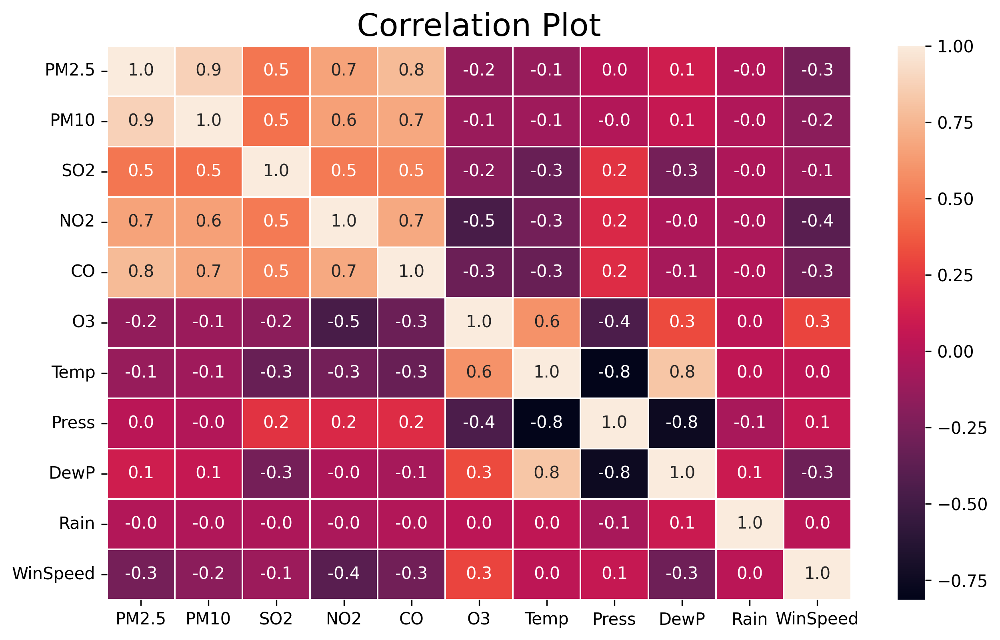

In [ ]:
plt.figure(figsize=(10,6), dpi=300)
sns.heatmap(df.drop(["Year", "Month", "Day", "Hour", "Date"], axis=1).corr(),
            annot=True, linewidths=.5, fmt= '.1f')
plt.title("Correlation Plot", fontsize=19)
plt.show()

From the correlation table, we can find the following:

There are great correlation among the different air pollutant such as SO2, CO, NO2, O3 with respect to PM2.5 and PM10. 

It also shows the impact of the air pollutants on greenhouse effect.

It shows the how dew point gets effected by temperature, pressure and other pollutants

#### Yearly Analysis of Air Pollutants

<Figure size 1920x1440 with 0 Axes>

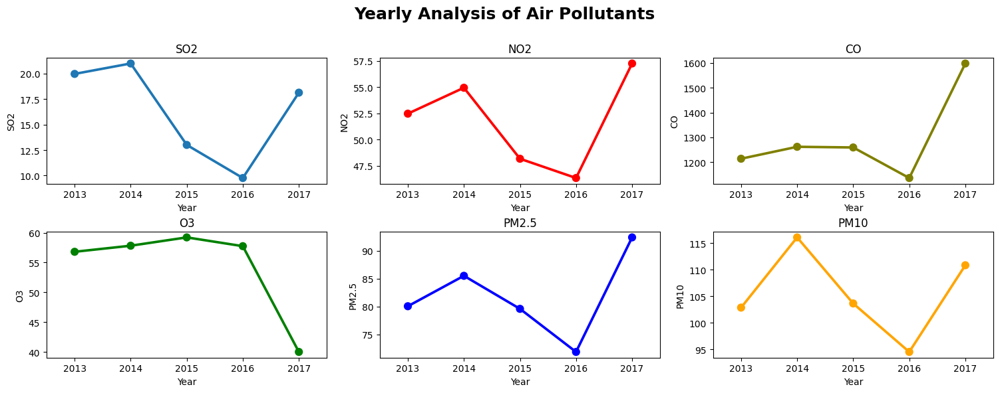

In [ ]:
plt.figure(dpi= 300)
fig,ax=plt.subplots(2, 3,figsize=(15,6))

temp = df[['SO2','Year']].groupby(["Year"]).mean()
ax[0, 0].set_title('SO2')
sns.pointplot(ax= ax[0,0],x=temp.index, y='SO2', data=temp)

temp = df[['NO2','Year']].groupby(["Year"]).mean()
ax[0, 1].set_title('NO2')
sns.pointplot(ax= ax[0,1], x=temp.index, y='NO2', data=temp,markers='o', color='red')

temp = df[['CO','Year']].groupby(["Year"]).mean()
ax[0, 2].set_title('CO')
sns.pointplot(ax= ax[0,2],x=temp.index, y='CO', data=temp,markers='o', color='olive')

temp = df[['O3','Year']].groupby(["Year"]).mean()
ax[1, 0].set_title('O3')
sns.pointplot(ax=ax[1, 0], x=temp.index, y='O3', data=temp,markers='o', color='green')

temp = df[['PM2.5','Year']].groupby(["Year"]).mean()
ax[1, 1].set_title('PM2.5')
sns.pointplot(ax=ax[1, 1],x=temp.index, y='PM2.5', data=temp,markers='o', color='blue')

temp = df[['PM10','Year']].groupby(["Year"]).mean()
ax[1, 2].set_title('PM10')
sns.pointplot(ax=ax[1,2], x=temp.index, y='PM10', data=temp,markers='o', color='orange')

fig.tight_layout()
fig.subplots_adjust(top=0.85)
plt.suptitle("Yearly Analysis of Air Pollutants", fontsize=18, fontweight= 'bold')
plt.show()

#### Station-wise Analysis of Air Pollutants

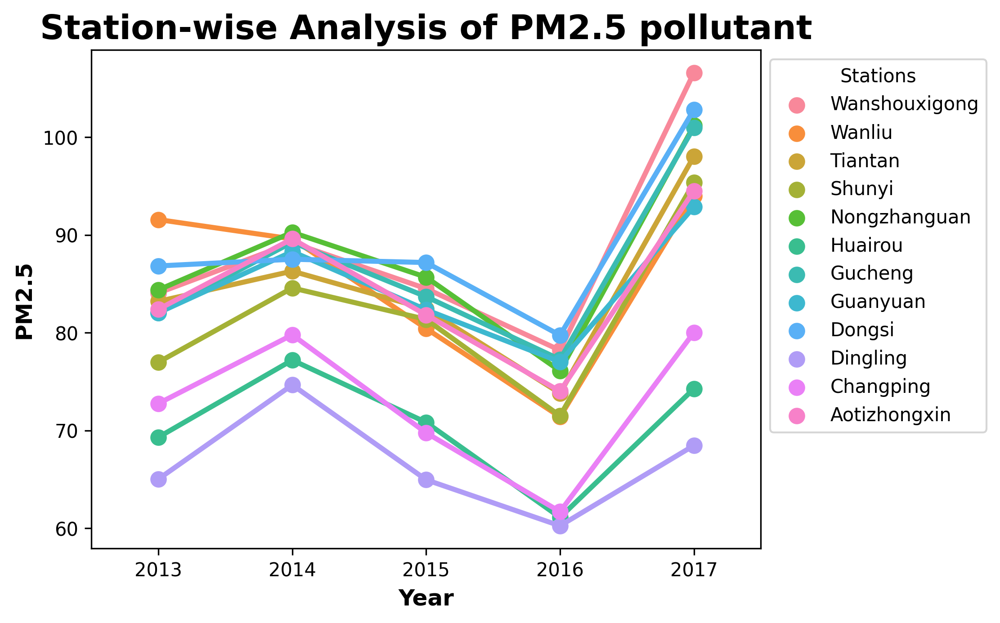

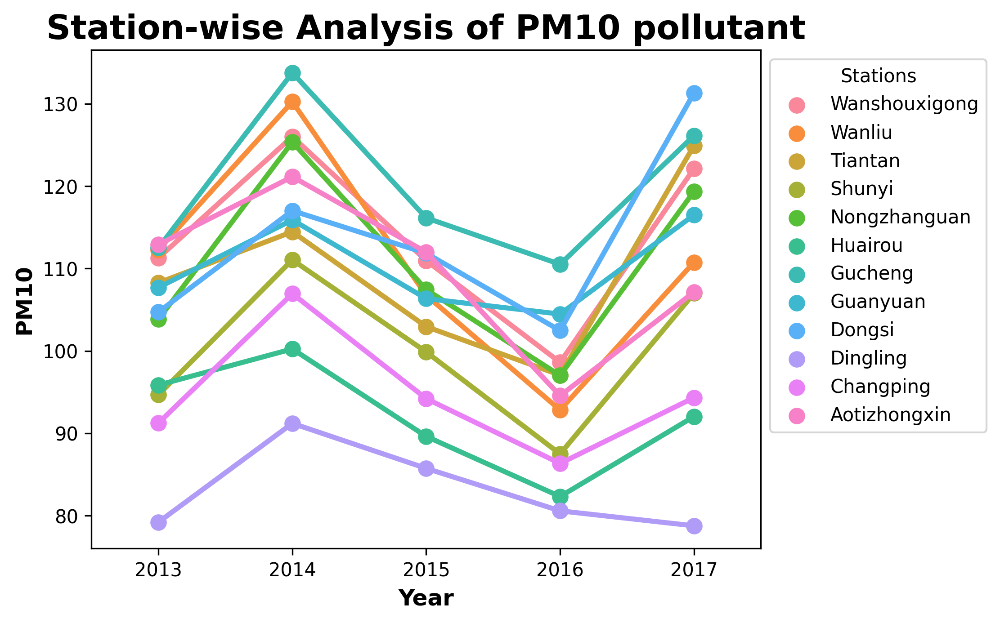

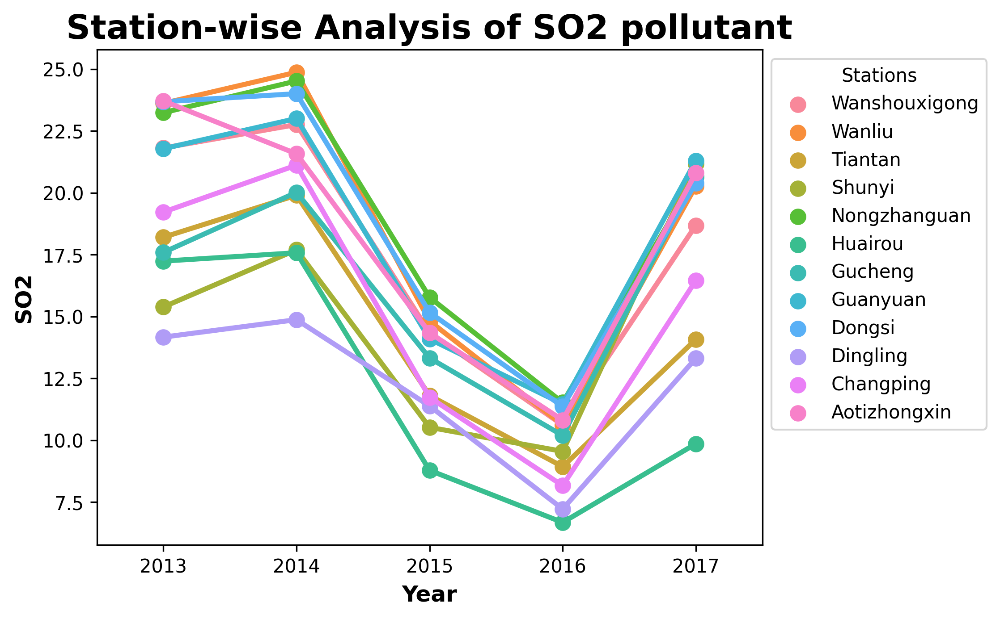

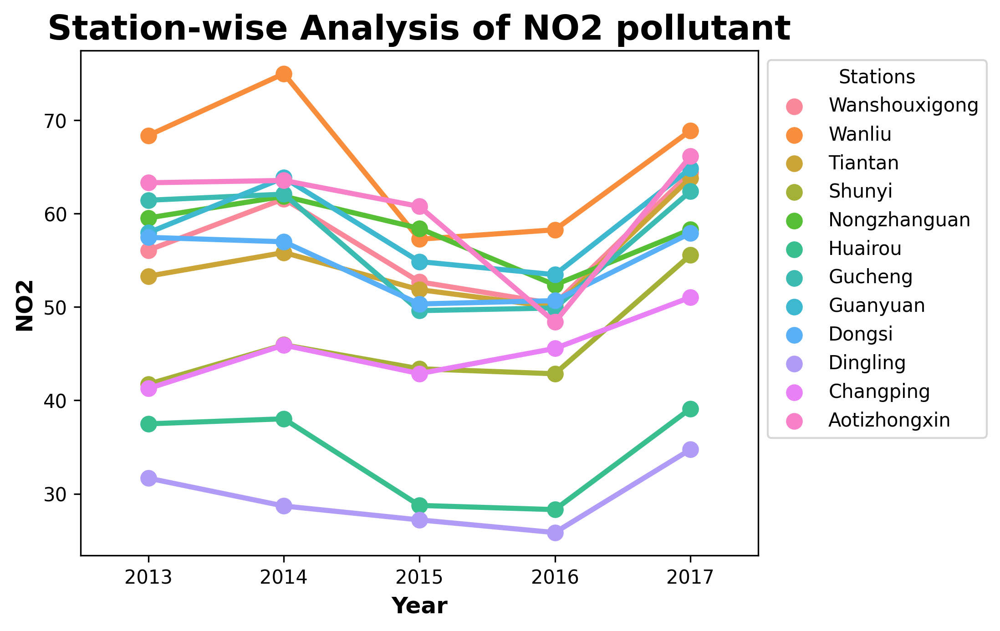

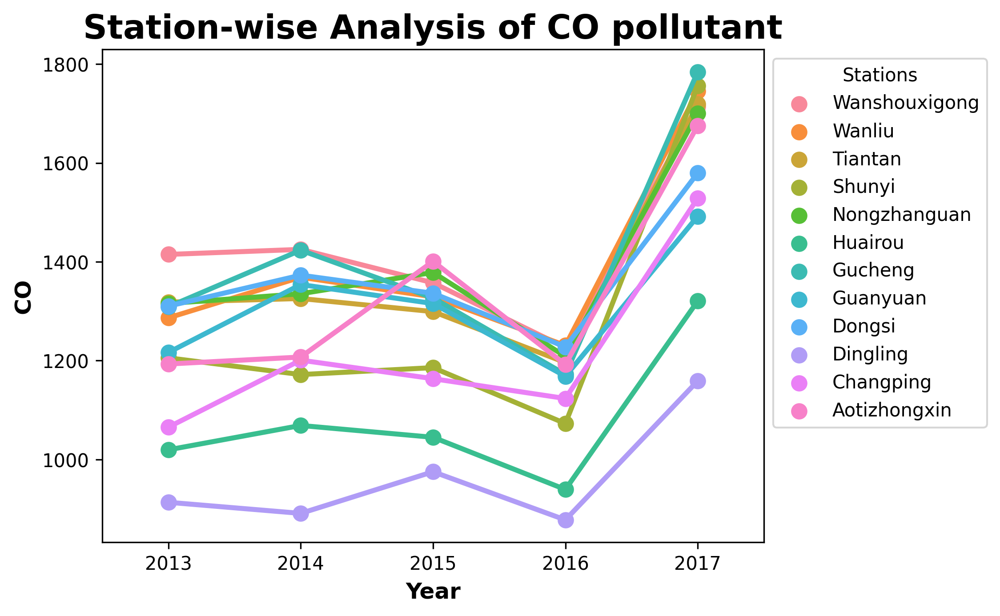

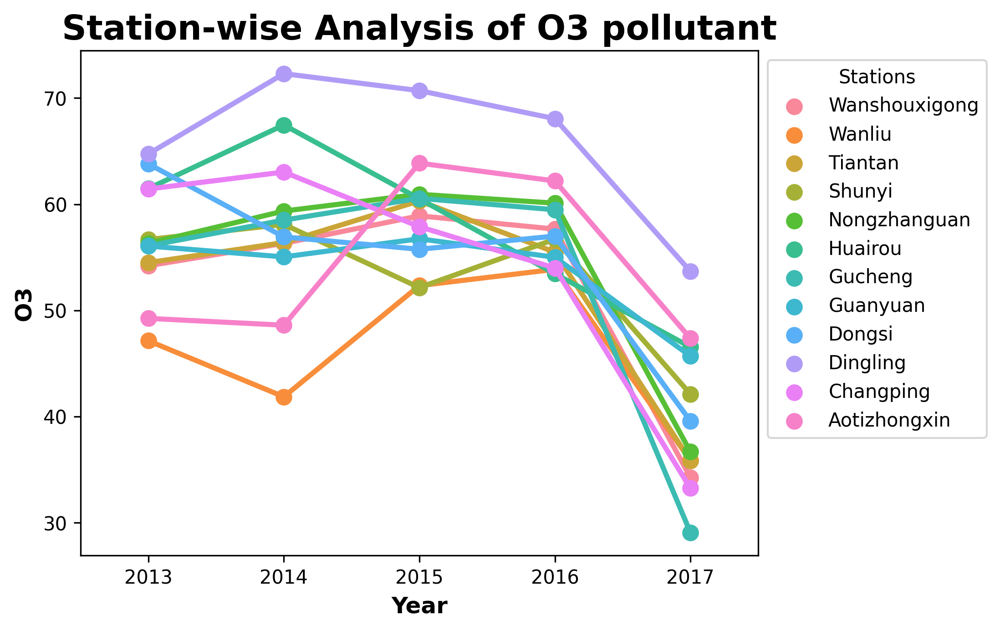

In [ ]:

pollutants= ["PM2.5", "PM10", "SO2", "NO2", "CO", "O3"]
for pollutant in pollutants:
    temp= df[[pollutant, 'Year', 'Station']].groupby(['Year', 'Station']).mean().reset_index().sort_values(by=['Year','Station'], ascending=False)
    plt.figure(dpi= 300)
    sns.pointplot(x='Year', y=pollutant, data=temp, hue= 'Station')
    plt.xlabel("Year", fontsize=12, fontweight="bold")
    plt.ylabel("{}".format(pollutant), fontsize=12, fontweight= "bold")
    plt.xticks(fontsize= 10)
    plt.yticks(fontsize=10)
    plt.legend(bbox_to_anchor=(1,1), fontsize=10, title= "Stations")
    plt.title("Station-wise Analysis of {} pollutant".format(pollutant), fontsize= 18, fontweight='bold')
    


In [ ]:
years

[2013, 2014, 2015, 2016, 2017]

#### Monthly Analysis of Air Pollutants

In [ ]:
custom_dict = {1:'Jan', 2:'Feb', 3:'Mar', 4:'Apr', 5:'May', 6:'Jun', 7:'Jul', 8:'Aug', 9:'Sep', 10:'Oct', 11:'Nov', 12:'Dec'}

<Figure size 1920x1440 with 0 Axes>

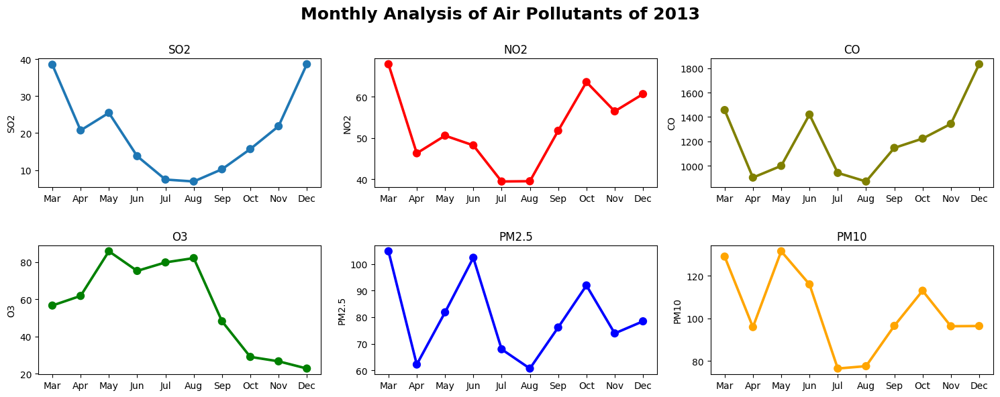

<Figure size 1920x1440 with 0 Axes>

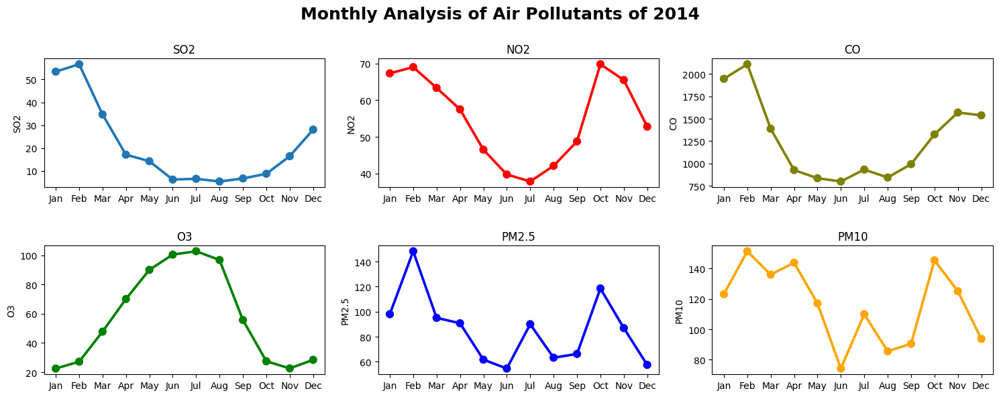

<Figure size 1920x1440 with 0 Axes>

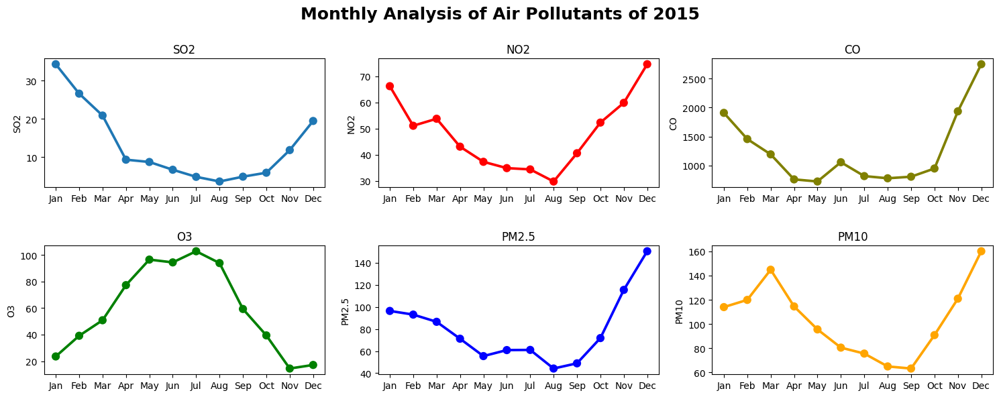

<Figure size 1920x1440 with 0 Axes>

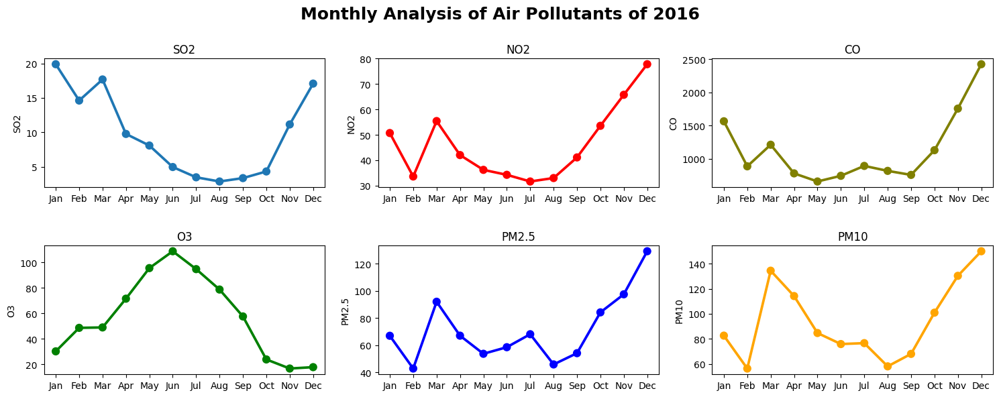

<Figure size 1920x1440 with 0 Axes>

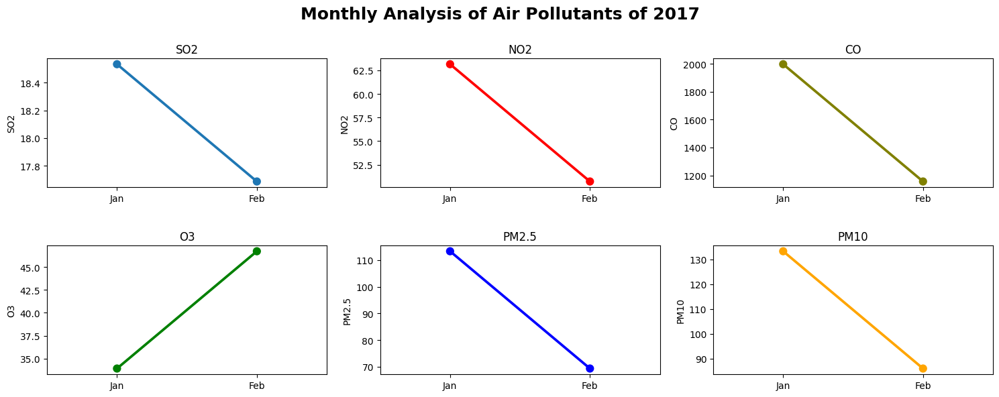

In [ ]:
temp_month= df.copy()
years= temp_month.Year.unique().tolist()

for year in years:
    plt.figure(dpi= 300)
    fig,ax=plt.subplots(2, 3,figsize=(15,6))

    temp = temp_month[temp_month.Year==year][['SO2','Month']].groupby(["Month"]).mean()
    ax[0, 0].set_title('SO2')
    sns.pointplot(ax= ax[0,0], x=[custom_dict[i] for i in temp.index], y='SO2', data=temp)    
    
    temp = temp_month[temp_month.Year==year][['NO2','Month']].groupby(["Month"]).mean()
    ax[0, 1].set_title('NO2')
    sns.pointplot(ax= ax[0,1], x=[custom_dict[i] for i in temp.index], y='NO2', data=temp,markers='o', color='red')

    temp = temp_month[temp_month.Year==year][['CO','Month']].groupby(["Month"]).mean()
    ax[0, 2].set_title('CO')
    sns.pointplot(ax= ax[0,2], x=[custom_dict[i] for i in temp.index], y='CO', data=temp,markers='o', color='olive')

    temp = temp_month[temp_month.Year==year][['O3','Month']].groupby(["Month"]).mean()
    ax[1, 0].set_title('O3')
    sns.pointplot(ax=ax[1, 0], x=[custom_dict[i] for i in temp.index], y='O3', data=temp,markers='o', color='green')

    temp = temp_month[temp_month.Year==year][['PM2.5','Month']].groupby(["Month"]).mean()
    ax[1, 1].set_title('PM2.5')
    sns.pointplot(ax=ax[1, 1], x=[custom_dict[i] for i in temp.index], y='PM2.5', data=temp,markers='o', color='blue')

    temp = temp_month[temp_month.Year==year][['PM10','Month']].groupby(["Month"]).mean()
    ax[1, 2].set_title('PM10')
    sns.pointplot(ax=ax[1,2], x=[custom_dict[i] for i in temp.index], y='PM10', data=temp,markers='o', color='orange')

    fig.tight_layout()
    fig.subplots_adjust(top=0.85, hspace=0.45)
    plt.suptitle("Monthly Analysis of Air Pollutants of {}".format(year), fontsize=18, fontweight= 'bold')
    plt.show()

##### Overall

<Figure size 1920x1440 with 0 Axes>

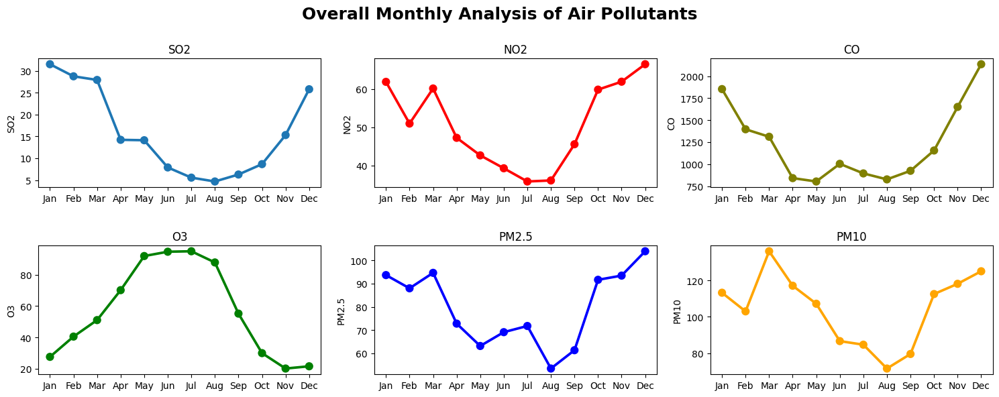

In [ ]:

plt.figure(dpi= 300)
fig,ax=plt.subplots(2, 3,figsize=(15,6))

temp = temp_month[['SO2','Month']].groupby(["Month"]).mean()
ax[0, 0].set_title('SO2')
sns.pointplot(ax= ax[0,0], x=[custom_dict[i] for i in temp.index], y='SO2', data=temp)    

temp = temp_month[['NO2','Month']].groupby(["Month"]).mean()
ax[0, 1].set_title('NO2')
sns.pointplot(ax= ax[0,1], x=[custom_dict[i] for i in temp.index], y='NO2', data=temp,markers='o', color='red')

temp = temp_month[['CO','Month']].groupby(["Month"]).mean()
ax[0, 2].set_title('CO')
sns.pointplot(ax= ax[0,2], x=[custom_dict[i] for i in temp.index], y='CO', data=temp,markers='o', color='olive')

temp = temp_month[['O3','Month']].groupby(["Month"]).mean()
ax[1, 0].set_title('O3')
sns.pointplot(ax=ax[1, 0], x=[custom_dict[i] for i in temp.index], y='O3', data=temp,markers='o', color='green')

temp = temp_month[['PM2.5','Month']].groupby(["Month"]).mean()
ax[1, 1].set_title('PM2.5')
sns.pointplot(ax=ax[1, 1], x=[custom_dict[i] for i in temp.index], y='PM2.5', data=temp,markers='o', color='blue')

temp = temp_month[['PM10','Month']].groupby(["Month"]).mean()
ax[1, 2].set_title('PM10')
sns.pointplot(ax=ax[1,2], x=[custom_dict[i] for i in temp.index], y='PM10', data=temp,markers='o', color='orange')

fig.tight_layout()
fig.subplots_adjust(top=0.85, hspace=0.45)
plt.suptitle("Overall Monthly Analysis of Air Pollutants", fontsize=18, fontweight= 'bold')
plt.show()

#### Weekly Analysis of Air Pollutants

In [ ]:
custom_day = {'Monday':0, 'Tuesday':1,'Wednesday':2,'Thursday':3,'Friday':4,'Saturday':5,'Sunday':6}
day_abbrv = {'Monday':'Mon', 'Tuesday':'Tue','Wednesday':'Wed','Thursday':'Thur','Friday':'Fri','Saturday':'Sat','Sunday':'Sun'}

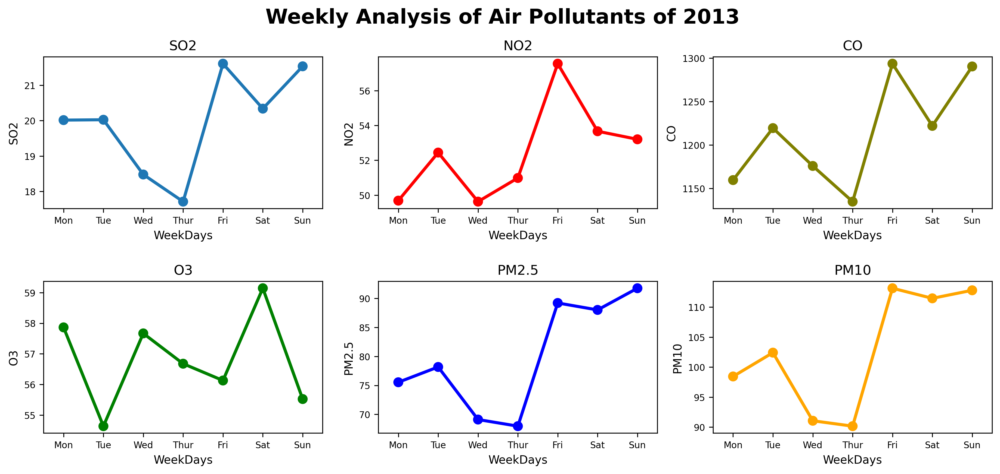

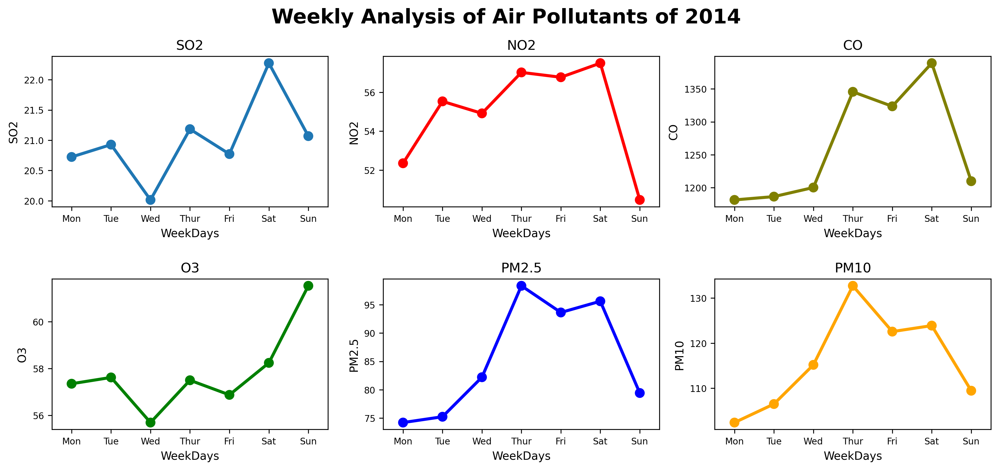

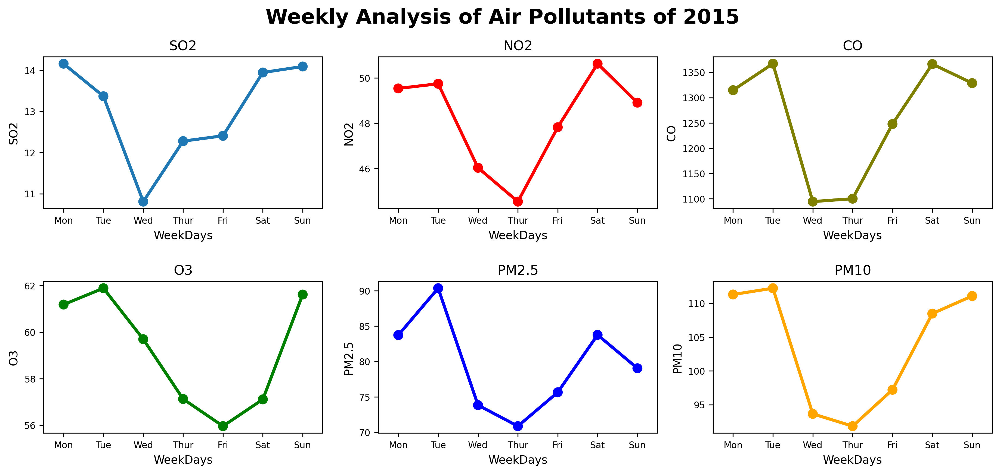

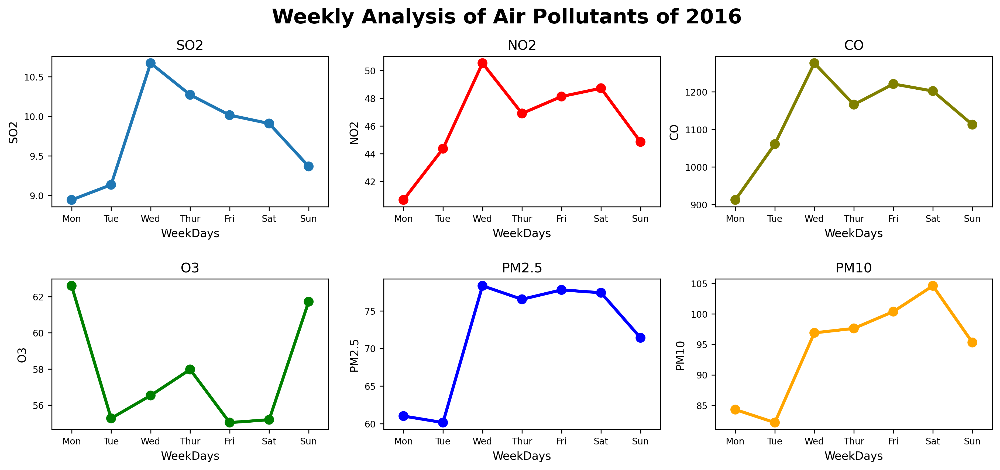

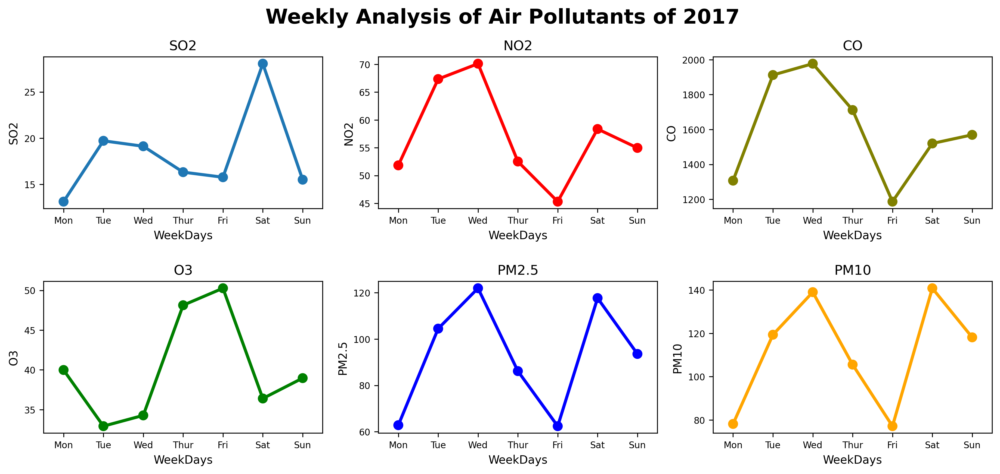

In [ ]:
temp_month= df.copy()
years= temp_month.Year.unique().tolist()


for year in years:
    plt.figure(dpi= 300, figsize=(15,6))
    plt.subplot(231)
    temp = temp_month[temp_month.Year==year][['SO2','DayNames']].groupby(["DayNames"]).mean().reset_index().sort_values(by='DayNames', ascending= True)
    temp=temp.iloc[temp['DayNames'].map(custom_day).argsort()]
    temp['DayNames']= temp['DayNames'].apply(lambda x: day_abbrv[x])
    sns.pointplot(x= 'DayNames', y= 'SO2', data=temp)    
    plt.xticks(fontsize=8) 
    plt.yticks(fontsize=8) 
    plt.xlabel('WeekDays', fontsize=10)
    plt.ylabel('SO2', fontsize=10)
    plt.title('SO2')

    plt.subplot(232)
    temp = temp_month[temp_month.Year==year][['NO2','DayNames']].groupby(["DayNames"]).mean().reset_index().sort_values(by='DayNames', ascending= True)
    temp=temp.iloc[temp['DayNames'].map(custom_day).argsort()]
    temp['DayNames']= temp['DayNames'].apply(lambda x: day_abbrv[x])    
    sns.pointplot(x='DayNames', y='NO2', data=temp, markers='o', color='red')
    plt.xticks(fontsize=8) 
    plt.yticks(fontsize=8) 
    plt.xlabel('WeekDays', fontsize=10)
    plt.ylabel('NO2', fontsize=10)
    plt.title('NO2')

    plt.subplot(233)
    temp = temp_month[temp_month.Year==year][['CO','DayNames']].groupby(["DayNames"]).mean().reset_index().sort_values(by='DayNames', ascending= True)
    temp=temp.iloc[temp['DayNames'].map(custom_day).argsort()]
    temp['DayNames']= temp['DayNames'].apply(lambda x: day_abbrv[x])
    sns.pointplot(x= 'DayNames', y= 'CO', data=temp, markers='o', color='olive')    
    plt.xticks(fontsize=8) 
    plt.yticks(fontsize=8) 
    plt.xlabel('WeekDays', fontsize=10)
    plt.ylabel('CO', fontsize=10)
    plt.title('CO')

    plt.subplot(234)
    temp = temp_month[temp_month.Year==year][['O3','DayNames']].groupby(["DayNames"]).mean().reset_index().sort_values(by='DayNames', ascending= True)
    temp=temp.iloc[temp['DayNames'].map(custom_day).argsort()]
    temp['DayNames']= temp['DayNames'].apply(lambda x: day_abbrv[x])
    sns.pointplot(x= 'DayNames', y= 'O3', data=temp, markers='o', color='green')    
    plt.xticks(fontsize=8) 
    plt.yticks(fontsize=8) 
    plt.xlabel('WeekDays', fontsize=10)
    plt.ylabel('O3', fontsize=10)
    plt.title('O3')

    plt.subplot(235)
    temp = temp_month[temp_month.Year==year][['PM2.5','DayNames']].groupby(["DayNames"]).mean().reset_index().sort_values(by='DayNames', ascending= True)
    temp=temp.iloc[temp['DayNames'].map(custom_day).argsort()]
    temp['DayNames']= temp['DayNames'].apply(lambda x: day_abbrv[x])    
    sns.pointplot(x='DayNames', y='PM2.5', data=temp, markers='o', color='blue')
    plt.xticks(fontsize=8) 
    plt.yticks(fontsize=8) 
    plt.xlabel('WeekDays', fontsize=10)
    plt.ylabel('PM2.5', fontsize=10)
    plt.title('PM2.5')

    plt.subplot(236)
    temp = temp_month[temp_month.Year==year][['PM10','DayNames']].groupby(["DayNames"]).mean().reset_index().sort_values(by='DayNames', ascending= True)
    temp=temp.iloc[temp['DayNames'].map(custom_day).argsort()]
    temp['DayNames']= temp['DayNames'].apply(lambda x: day_abbrv[x])
    sns.pointplot(x= 'DayNames', y= 'PM10', data=temp, markers='o', color='orange')    
    plt.xticks(fontsize=8) 
    plt.yticks(fontsize=8) 
    plt.xlabel('WeekDays', fontsize=10)
    plt.ylabel('PM10', fontsize=10)
    plt.title('PM10')

    plt.subplots_adjust(hspace=0.48)
    plt.suptitle("Weekly Analysis of Air Pollutants of {}".format(year), fontsize= 18, fontweight= 'bold')
    plt.show()

    

##### Overall

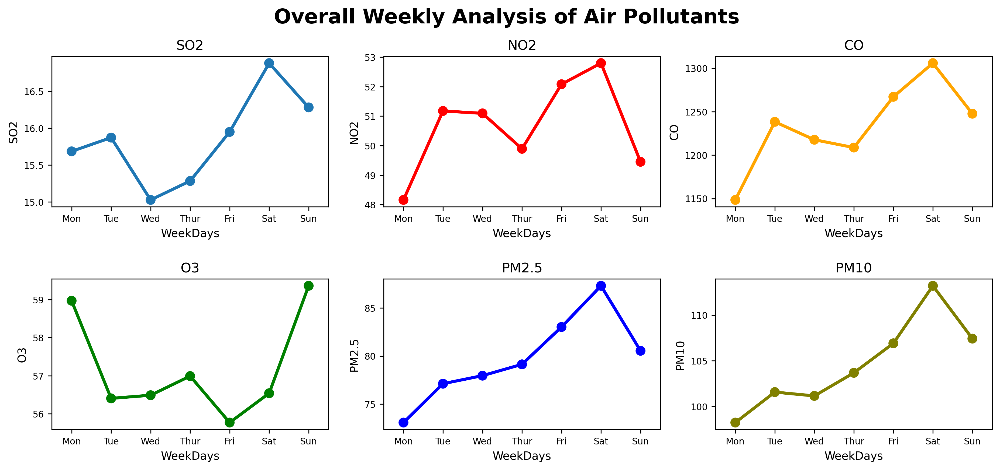

In [ ]:
plt.figure(dpi= 300, figsize=(15,6))
plt.subplot(231)
temp = temp_month[['SO2','DayNames']].groupby(["DayNames"]).mean().reset_index().sort_values(by='DayNames', ascending= True)
temp=temp.iloc[temp['DayNames'].map(custom_day).argsort()]
temp['DayNames']= temp['DayNames'].apply(lambda x: day_abbrv[x])
sns.pointplot(x= 'DayNames', y= 'SO2', data=temp)    
plt.xticks(fontsize=8) 
plt.yticks(fontsize=8) 
plt.xlabel('WeekDays', fontsize=10)
plt.ylabel('SO2', fontsize=10)
plt.title('SO2')

plt.subplot(232)
temp = temp_month[['NO2','DayNames']].groupby(["DayNames"]).mean().reset_index().sort_values(by='DayNames', ascending= True)
temp=temp.iloc[temp['DayNames'].map(custom_day).argsort()]
temp['DayNames']= temp['DayNames'].apply(lambda x: day_abbrv[x])    
sns.pointplot(x='DayNames', y='NO2', data=temp,markers='o', color='red')
plt.xticks(fontsize=8) 
plt.yticks(fontsize=8) 
plt.xlabel('WeekDays', fontsize=10)
plt.ylabel('NO2', fontsize=10)
plt.title('NO2')

plt.subplot(233)
temp = temp_month[['CO','DayNames']].groupby(["DayNames"]).mean().reset_index().sort_values(by='DayNames', ascending= True)
temp=temp.iloc[temp['DayNames'].map(custom_day).argsort()]
temp['DayNames']= temp['DayNames'].apply(lambda x: day_abbrv[x])
sns.pointplot(x= 'DayNames', y= 'CO', data=temp, markers='o', color='orange')    
plt.xticks(fontsize=8) 
plt.yticks(fontsize=8) 
plt.xlabel('WeekDays', fontsize=10)
plt.ylabel('CO', fontsize=10)
plt.title('CO')

plt.subplot(234)
temp = temp_month[['O3','DayNames']].groupby(["DayNames"]).mean().reset_index().sort_values(by='DayNames', ascending= True)
temp=temp.iloc[temp['DayNames'].map(custom_day).argsort()]
temp['DayNames']= temp['DayNames'].apply(lambda x: day_abbrv[x])
sns.pointplot(x= 'DayNames', y= 'O3', data=temp, markers='o', color='green')    
plt.xticks(fontsize=8) 
plt.yticks(fontsize=8) 
plt.xlabel('WeekDays', fontsize=10)
plt.ylabel('O3', fontsize=10)
plt.title('O3')

plt.subplot(235)
temp = temp_month[['PM2.5','DayNames']].groupby(["DayNames"]).mean().reset_index().sort_values(by='DayNames', ascending= True)
temp=temp.iloc[temp['DayNames'].map(custom_day).argsort()]
temp['DayNames']= temp['DayNames'].apply(lambda x: day_abbrv[x])    
sns.pointplot(x='DayNames', y='PM2.5', data=temp, markers='o', color='blue')
plt.xticks(fontsize=8) 
plt.yticks(fontsize=8) 
plt.xlabel('WeekDays', fontsize=10)
plt.ylabel('PM2.5', fontsize=10)
plt.title('PM2.5')

plt.subplot(236)
temp = temp_month[['PM10','DayNames']].groupby(["DayNames"]).mean().reset_index().sort_values(by='DayNames', ascending= True)
temp=temp.iloc[temp['DayNames'].map(custom_day).argsort()]
temp['DayNames']= temp['DayNames'].apply(lambda x: day_abbrv[x])
sns.pointplot(x= 'DayNames', y= 'PM10', data=temp, markers='o', color='olive')    
plt.xticks(fontsize=8) 
plt.yticks(fontsize=8) 
plt.xlabel('WeekDays', fontsize=10)
plt.ylabel('PM10', fontsize=10)
plt.title('PM10')

plt.subplots_adjust(hspace=0.48)
plt.suptitle("Overall Weekly Analysis of Air Pollutants", fontsize= 18, fontweight= 'bold')
plt.show()



#### Hourly Analysis of Air Pollutants

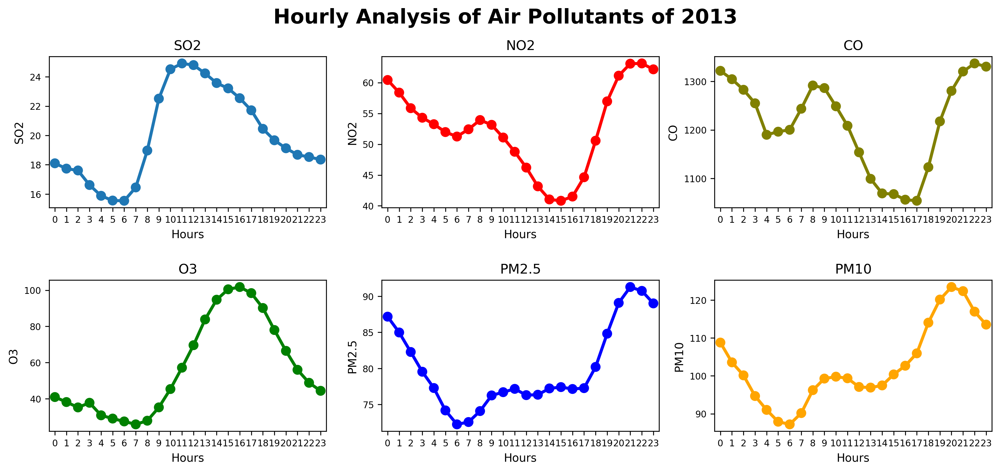

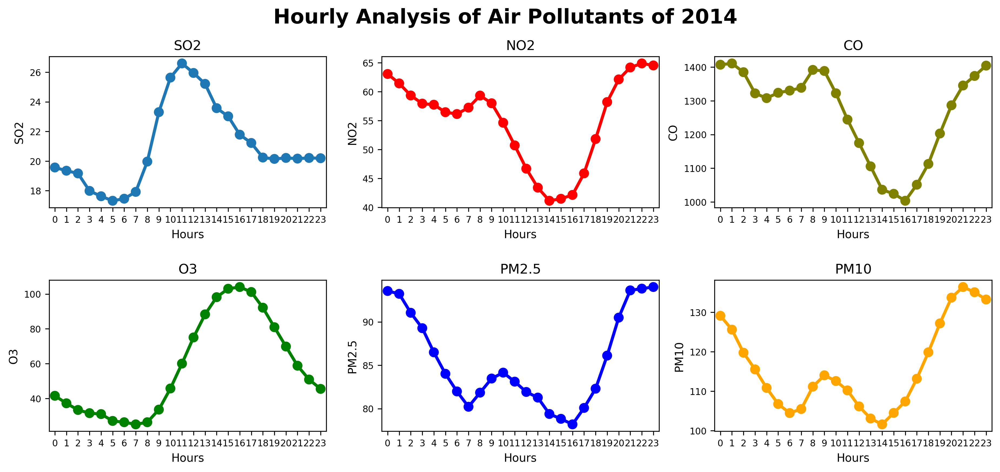

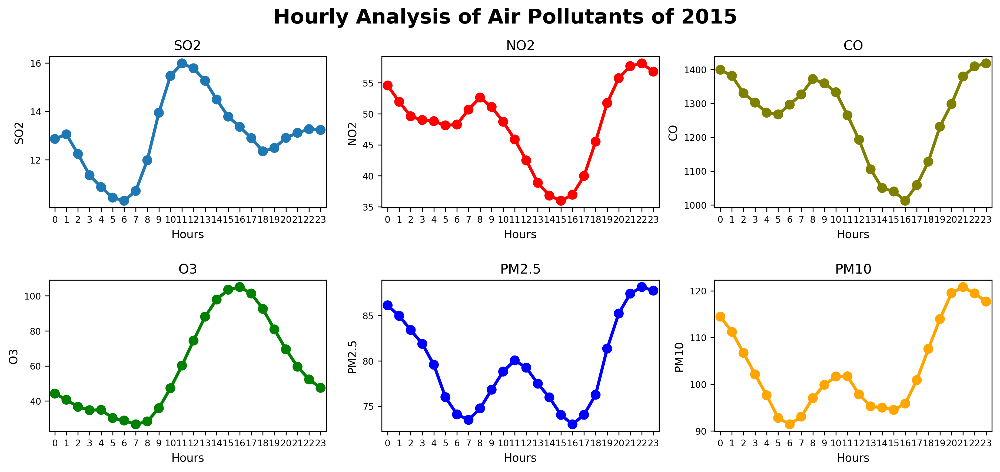

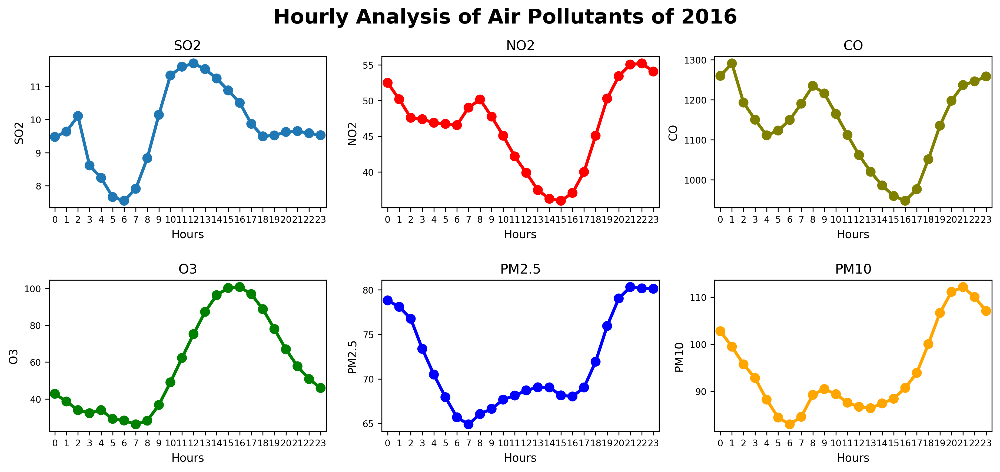

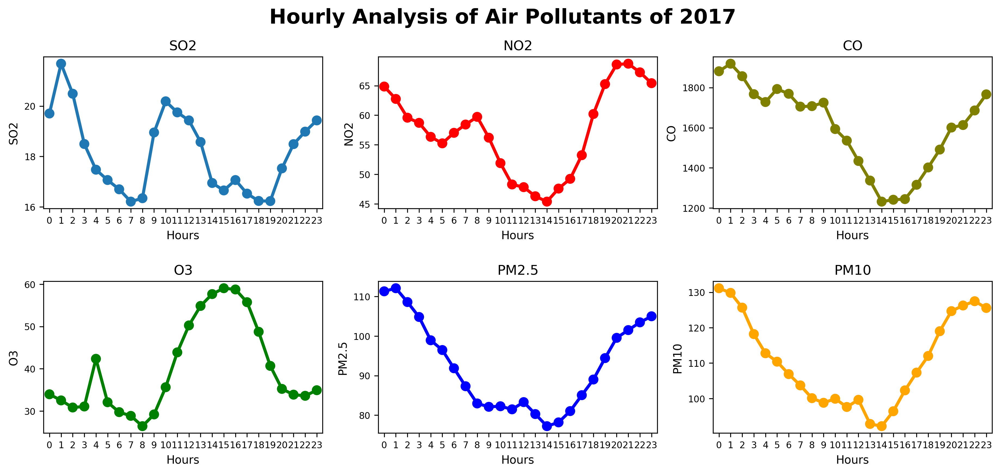

In [ ]:
temp_month= df.copy()

for year in years:
    plt.figure(dpi= 300, figsize=(15,6))
    plt.subplot(231)
    temp = temp_month[temp_month.Year==year][['SO2','Hour']].groupby(["Hour"]).mean().reset_index().sort_values(by='Hour', ascending= True)
    sns.pointplot(x= 'Hour', y= 'SO2', data=temp)    
    plt.xticks(fontsize=8) 
    plt.yticks(fontsize=8) 
    plt.xlabel('Hours', fontsize=10)
    plt.ylabel('SO2', fontsize=10)
    plt.title('SO2')

    plt.subplot(232)
    temp = temp_month[temp_month.Year==year][['NO2','Hour']].groupby(["Hour"]).mean().reset_index().sort_values(by='Hour', ascending= True)
    sns.pointplot(x='Hour', y='NO2', data=temp,markers='o', color='red')
    plt.xticks(fontsize=8) 
    plt.yticks(fontsize=8) 
    plt.xlabel('Hours', fontsize=10)
    plt.ylabel('NO2', fontsize=10)
    plt.title('NO2')

    plt.subplot(233)
    temp = temp_month[temp_month.Year==year][['CO','Hour']].groupby(["Hour"]).mean().reset_index().sort_values(by='Hour', ascending= True)
    sns.pointplot(x= 'Hour', y= 'CO', data=temp, markers='o', color='olive')    
    plt.xticks(fontsize=8) 
    plt.yticks(fontsize=8) 
    plt.xlabel('Hours', fontsize=10)
    plt.ylabel('CO', fontsize=10)
    plt.title('CO')

    plt.subplot(234)
    temp = temp_month[temp_month.Year==year][['O3','Hour']].groupby(["Hour"]).mean().reset_index().sort_values(by='Hour', ascending= True)
    sns.pointplot(x= 'Hour', y= 'O3', data=temp, markers='o', color='green')    
    plt.xticks(fontsize=8) 
    plt.yticks(fontsize=8) 
    plt.xlabel('Hours', fontsize=10)
    plt.ylabel('O3', fontsize=10)
    plt.title('O3')

    plt.subplot(235)
    temp = temp_month[temp_month.Year==year][['PM2.5','Hour']].groupby(["Hour"]).mean().reset_index().sort_values(by='Hour', ascending= True)
    sns.pointplot(x='Hour', y='PM2.5', data=temp,markers='o', color='blue')
    plt.xticks(fontsize=8) 
    plt.yticks(fontsize=8) 
    plt.xlabel('Hours', fontsize=10)
    plt.ylabel('PM2.5', fontsize=10)
    plt.title('PM2.5')

    plt.subplot(236)
    temp = temp_month[temp_month.Year==year][['PM10','Hour']].groupby(["Hour"]).mean().reset_index().sort_values(by='Hour', ascending= True)
    sns.pointplot(x= 'Hour', y= 'PM10', data=temp, markers='o', color='orange')    
    plt.xticks(fontsize=8) 
    plt.yticks(fontsize=8) 
    plt.xlabel('Hours', fontsize=10)
    plt.ylabel('PM10', fontsize=10)
    plt.title('PM10')

    plt.subplots_adjust(hspace=0.48)
    plt.suptitle("Hourly Analysis of Air Pollutants of {}".format(year), fontsize= 18, fontweight= 'bold')
    plt.show()

    

##### Overall

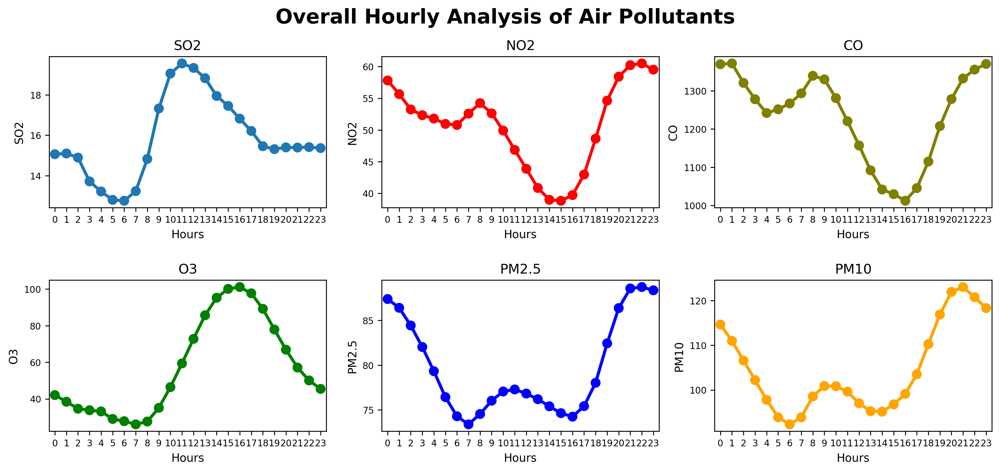

In [ ]:
plt.figure(dpi= 300, figsize=(15,6))
plt.subplot(231)
temp = temp_month[['SO2','Hour']].groupby(["Hour"]).mean().reset_index().sort_values(by='Hour', ascending= True)
sns.pointplot(x= 'Hour', y= 'SO2', data=temp)    
plt.xticks(fontsize=8) 
plt.yticks(fontsize=8) 
plt.xlabel('Hours', fontsize=10)
plt.ylabel('SO2', fontsize=10)
plt.title('SO2')

plt.subplot(232)
temp = temp_month[['NO2','Hour']].groupby(["Hour"]).mean().reset_index().sort_values(by='Hour', ascending= True)
sns.pointplot(x='Hour', y='NO2', data=temp,markers='o', color='red')
plt.xticks(fontsize=8) 
plt.yticks(fontsize=8) 
plt.xlabel('Hours', fontsize=10)
plt.ylabel('NO2', fontsize=10)
plt.title('NO2')

plt.subplot(233)
temp = temp_month[['CO','Hour']].groupby(["Hour"]).mean().reset_index().sort_values(by='Hour', ascending= True)
sns.pointplot(x= 'Hour', y= 'CO', data=temp, markers='o', color='olive')    
plt.xticks(fontsize=8) 
plt.yticks(fontsize=8) 
plt.xlabel('Hours', fontsize=10)
plt.ylabel('CO', fontsize=10)
plt.title('CO')

plt.subplot(234)
temp = temp_month[['O3','Hour']].groupby(["Hour"]).mean().reset_index().sort_values(by='Hour', ascending= True)
sns.pointplot(x= 'Hour', y= 'O3', data=temp, markers='o', color='green')    
plt.xticks(fontsize=8) 
plt.yticks(fontsize=8) 
plt.xlabel('Hours', fontsize=10)
plt.ylabel('O3', fontsize=10)
plt.title('O3')

plt.subplot(235)
temp = temp_month[['PM2.5','Hour']].groupby(["Hour"]).mean().reset_index().sort_values(by='Hour', ascending= True)
sns.pointplot(x='Hour', y='PM2.5', data=temp,markers='o', color='blue')
plt.xticks(fontsize=8) 
plt.yticks(fontsize=8) 
plt.xlabel('Hours', fontsize=10)
plt.ylabel('PM2.5', fontsize=10)
plt.title('PM2.5')

plt.subplot(236)
temp = temp_month[['PM10','Hour']].groupby(["Hour"]).mean().reset_index().sort_values(by='Hour', ascending= True)
sns.pointplot(x= 'Hour', y= 'PM10', data=temp, markers='o', color='orange')    
plt.xticks(fontsize=8) 
plt.yticks(fontsize=8) 
plt.xlabel('Hours', fontsize=10)
plt.ylabel('PM10', fontsize=10)
plt.title('PM10')

plt.subplots_adjust(hspace=0.48)
plt.suptitle("Overall Hourly Analysis of Air Pollutants", fontsize= 18, fontweight= 'bold')
plt.show()



#### Effect of Air Pollutants on PMs

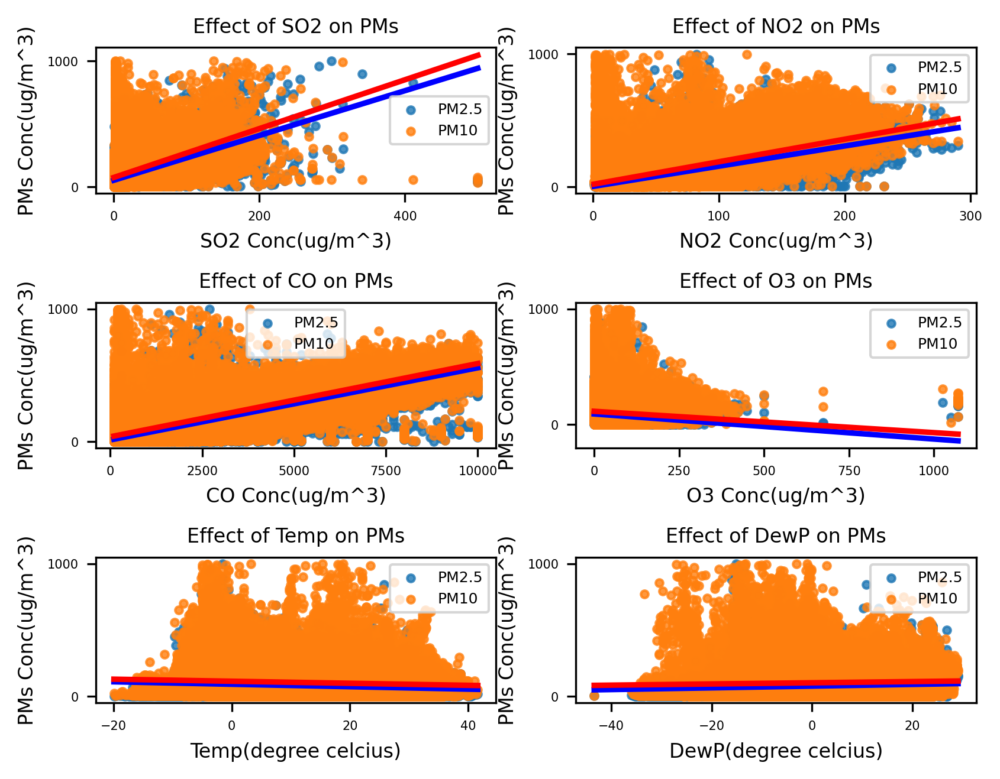

In [53]:
plt.figure(dpi=300)

plt.subplot(321)
sns.regplot(x='SO2', y='PM2.5',data=df, label= "PM2.5", marker='.', line_kws={'color':"blue"})
sns.regplot(x='SO2', y='PM10',data=df, label= "PM10", marker='.', line_kws={'color':"red"})
plt.xticks(fontsize=5) 
plt.yticks(fontsize=5)
plt.xlabel("SO2 Conc(ug/m^3)", fontsize = 8)
plt.ylabel("PMs Conc(ug/m^3)", fontsize = 8)
plt.title('Effect of SO2 on PMs', fontsize = 8)
plt.legend(fontsize=6)

plt.subplot(322)
sns.regplot(x='NO2', y='PM2.5',data=df, label= "PM2.5", marker='.', line_kws={'color':"blue"})
sns.regplot(x='NO2', y='PM10',data=df, label= "PM10", marker='.', line_kws={'color':"red"})
plt.xlabel("NO2 Conc(ug/m^3)", fontsize = 8)
plt.ylabel("PMs Conc(ug/m^3)", fontsize = 8)
plt.xticks(fontsize=5) 
plt.yticks(fontsize=5)
plt.title('Effect of NO2 on PMs', fontsize = 8)
plt.legend(fontsize=6)

plt.subplot(323)
sns.regplot(x='CO', y='PM2.5',data=df, label= "PM2.5", marker='.', line_kws={'color':"blue"})
sns.regplot(x='CO', y='PM10',data=df, label= "PM10", marker='.', line_kws={'color':"red"})
plt.xlabel("CO Conc(ug/m^3)", fontsize = 8)
plt.ylabel("PMs Conc(ug/m^3)", fontsize = 8)
plt.xticks(fontsize=5) 
plt.yticks(fontsize=5)
plt.title('Effect of CO on PMs', fontsize = 8)
plt.legend(fontsize=6)

plt.subplot(324)
sns.regplot(x='O3', y='PM2.5',data=df, label= "PM2.5", marker='.', line_kws={'color':"blue"})
sns.regplot(x='O3', y='PM10',data=df, label= "PM10", marker='.', line_kws={'color':"red"})
plt.xlabel("O3 Conc(ug/m^3)", fontsize = 8)
plt.ylabel("PMs Conc(ug/m^3)", fontsize = 8)
plt.xticks(fontsize=5) 
plt.yticks(fontsize=5)
plt.title('Effect of O3 on PMs', fontsize = 8)
plt.legend(fontsize=6)

plt.subplot(325)
sns.regplot(x='Temp', y='PM2.5', data=df, label= "PM2.5", marker='.', line_kws={'color':"blue"})
sns.regplot(x='Temp', y='PM10',data=df, label= "PM10", marker='.', line_kws={'color':"red"})
plt.xlabel("Temp(degree celcius)", fontsize = 8)
plt.ylabel("PMs Conc(ug/m^3)", fontsize = 8)
plt.xticks(fontsize=5) 
plt.yticks(fontsize=5)
plt.title('Effect of Temp on PMs', fontsize = 8)
plt.legend(fontsize=6)

plt.subplot(326)
sns.regplot(x='DewP', y='PM2.5',data=df, label= "PM2.5", marker='.', line_kws={'color':"blue"})
sns.regplot(x='DewP', y='PM10',data=df, label= "PM10", marker='.', line_kws={'color':"red"})
plt.xlabel("DewP(degree celcius)", fontsize = 8)
plt.ylabel("PMs Conc(ug/m^3)", fontsize = 8)
plt.xticks(fontsize=5) 
plt.yticks(fontsize=5)
plt.title('Effect of DewP on PMs', fontsize = 8)
plt.legend(fontsize=6)

plt.subplots_adjust(hspace=0.75)
plt.show()


#### Greenhouse Effect due to Air Pollutants

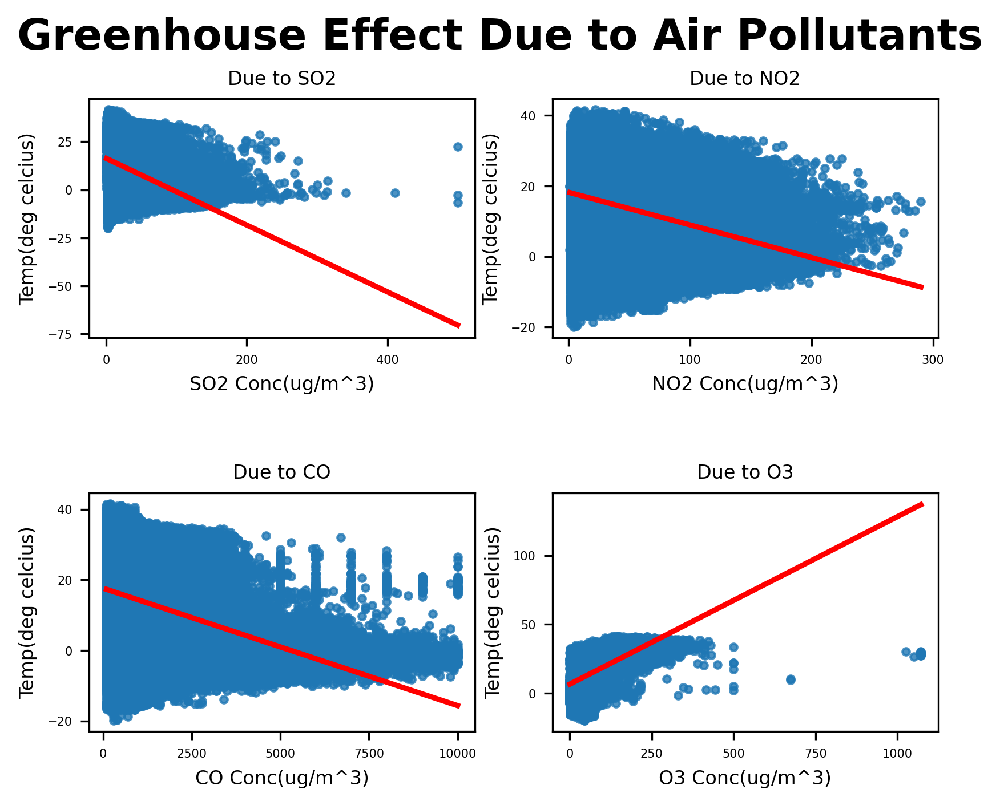

In [137]:
plt.figure(dpi=300)

plt.subplot(221)

sns.regplot(x='SO2', y='Temp',data=df, marker='.', line_kws={'color':"red"})
plt.xticks(fontsize=5) 
plt.yticks(fontsize=5)
plt.xlabel("SO2 Conc(ug/m^3)", fontsize = 8)
plt.ylabel("Temp(deg celcius)", fontsize = 8)
plt.title('Due to SO2', fontsize = 8)

plt.subplot(222)
sns.regplot(x='NO2', y='Temp',data=df, marker='.', line_kws={'color':"red"})
plt.xlabel("NO2 Conc(ug/m^3)", fontsize = 8)
plt.ylabel("Temp(deg celcius)", fontsize = 8)
plt.xticks(fontsize=5) 
plt.yticks(fontsize=5)
plt.title('Due to NO2', fontsize = 8)

plt.subplot(223)
sns.regplot(x='CO', y='Temp',data=df, marker='.', line_kws={'color':"red"})
plt.xlabel("CO Conc(ug/m^3)", fontsize = 8)
plt.ylabel("Temp(deg celcius)", fontsize = 8)
plt.xticks(fontsize=5) 
plt.yticks(fontsize=5)
plt.title('Due to CO', fontsize = 8)

plt.subplot(224)
sns.regplot(x='O3', y='Temp',data=df, marker='.', line_kws={'color':"red"})
plt.xlabel("O3 Conc(ug/m^3)", fontsize = 8)
plt.ylabel("Temp(deg celcius)", fontsize = 8)
plt.xticks(fontsize=5) 
plt.yticks(fontsize=5)
plt.title('Due to O3', fontsize = 8)

plt.subplots_adjust(hspace=0.65)
plt.suptitle("Greenhouse Effect Due to Air Pollutants", fontsize= 18, fontweight= 'bold')
plt.show()

### Clustering Using K-Means

In [17]:
clean_data.head()

,Year,Month,Day,Hour,PM2.5,PM10,SO2,NO2,CO,O3,Temp,Press,DewP,Rain,WinDir,WinSpeed,Station
0,2013,3,1,0,4.0,4.0,4.0,7.0,300.0,77.0,-0.7,1023.0,-18.8,0.0,NNW,4.4,Aotizhongxin
1,2013,3,1,1,8.0,8.0,4.0,7.0,300.0,77.0,-1.1,1023.2,-18.2,0.0,N,4.7,Aotizhongxin
2,2013,3,1,2,7.0,7.0,5.0,10.0,300.0,73.0,-1.1,1023.5,-18.2,0.0,NNW,5.6,Aotizhongxin
3,2013,3,1,3,6.0,6.0,11.0,11.0,300.0,72.0,-1.4,1024.5,-19.4,0.0,NW,3.1,Aotizhongxin
4,2013,3,1,4,3.0,3.0,12.0,12.0,300.0,72.0,-2.0,1025.2,-19.5,0.0,N,2.0,Aotizhongxin


In [103]:
df_new_1= clean_data[['PM2.5', 'SO2', 'NO2', 'CO',
       'O3', 'Temp', 'DewP', 'WinSpeed']]
df_new_2= clean_data[['PM10', 'SO2', 'NO2', 'CO',
       'O3', 'Temp', 'DewP', 'WinSpeed']]

In [104]:
df_new_1.head()

,PM2.5,SO2,NO2,CO,O3,Temp,DewP,WinSpeed
0,4.0,4.0,7.0,300.0,77.0,-0.7,-18.8,4.4
1,8.0,4.0,7.0,300.0,77.0,-1.1,-18.2,4.7
2,7.0,5.0,10.0,300.0,73.0,-1.1,-18.2,5.6
3,6.0,11.0,11.0,300.0,72.0,-1.4,-19.4,3.1
4,3.0,12.0,12.0,300.0,72.0,-2.0,-19.5,2.0


In [105]:
df_new_2.head()

,PM10,SO2,NO2,CO,O3,Temp,DewP,WinSpeed
0,4.0,4.0,7.0,300.0,77.0,-0.7,-18.8,4.4
1,8.0,4.0,7.0,300.0,77.0,-1.1,-18.2,4.7
2,7.0,5.0,10.0,300.0,73.0,-1.1,-18.2,5.6
3,6.0,11.0,11.0,300.0,72.0,-1.4,-19.4,3.1
4,3.0,12.0,12.0,300.0,72.0,-2.0,-19.5,2.0


In [106]:
df_new_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 420768 entries, 0 to 420767
Data columns (total 8 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   PM2.5     420768 non-null  float64
 1   SO2       420768 non-null  float64
 2   NO2       420768 non-null  float64
 3   CO        420768 non-null  float64
 4   O3        420768 non-null  float64
 5   Temp      420768 non-null  float64
 6   DewP      420768 non-null  float64
 7   WinSpeed  420768 non-null  float64
dtypes: float64(8)
memory usage: 25.7 MB


#### Clustering for PM2.5

##### Elbow Method to find out the optimal number of clusters

In [21]:
from sklearn.cluster import KMeans

In [112]:
x= df_new_1.iloc[:, :].values
wcs=[]

for i in range(1,25):
    model= KMeans(n_clusters=i, init='k-means++' ).fit(x)
    wcs.append(model.inertia_)


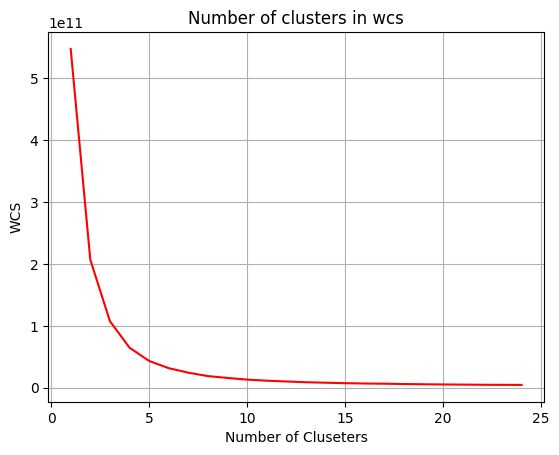

In [113]:
plt.plot(range(1,25), wcs, color='r')
plt.title("Number of clusters in wcs")
plt.xlabel("Number of Cluseters")
plt.ylabel("WCS")
plt.grid()
plt.show()

##### PCA Implementation

In [30]:
from sklearn.decomposition import PCA

In [119]:
pca= PCA()
red_arr= pca.fit_transform(df_new_1)

##### KMEANS 

In [120]:
kmeans = KMeans(n_clusters=4, random_state=0).fit(red_arr)
centroids= kmeans.cluster_centers_
print(centroids)

[[ 1.91236833e+03 -9.42019985e+00  9.44888482e+00  3.54116517e+00
   5.63751822e+00  3.85772546e-01  1.11006673e-01  2.09530526e-02]
 [-6.55801716e+02 -7.61368284e-01 -7.54323577e+00 -1.41522515e+00
  -3.97543464e-01 -6.07584145e-01 -3.04802398e-01  1.42916729e-02]
 [ 3.01288454e+02  4.16109352e+00  1.53854502e+01  2.69158915e+00
  -7.95511944e-01  1.44161902e+00  7.52591041e-01 -4.30956672e-02]
 [ 4.90978383e+03  4.32919148e+00 -5.48584428e+01 -1.54850714e+01
  -3.36075776e+00 -5.58070091e+00 -2.84261196e+00  1.25724298e-01]]


In [121]:
red_df = pd.DataFrame(red_arr, columns=['PM2.5', 'SO2', 'NO2', 'CO', 'O3', 'Temp', 'DewP', 'WinSpeed'])
red_df['Category']= kmeans.labels_

In [122]:
red_df.head()

,PM2.5,SO2,NO2,CO,O3,Temp,DewP,WinSpeed,Category
0,-937.096006,-11.290754,-29.595131,-14.495595,20.975646,-18.840047,2.168919,1.616095,1
1,-936.877827,-9.097906,-26.346704,-15.342950,21.110185,-18.795889,2.741282,1.984711,1
2,-936.797265,-13.157808,-24.208156,-13.019177,20.673900,-18.314658,2.514409,2.919592,1
3,-936.752132,-14.672593,-23.851962,-9.514397,25.249685,-16.136618,2.505077,0.391495,1
4,-936.881654,-16.449087,-25.900963,-7.620132,25.596406,-16.021848,3.144599,-0.646904,1


##### Plot of PM2.5

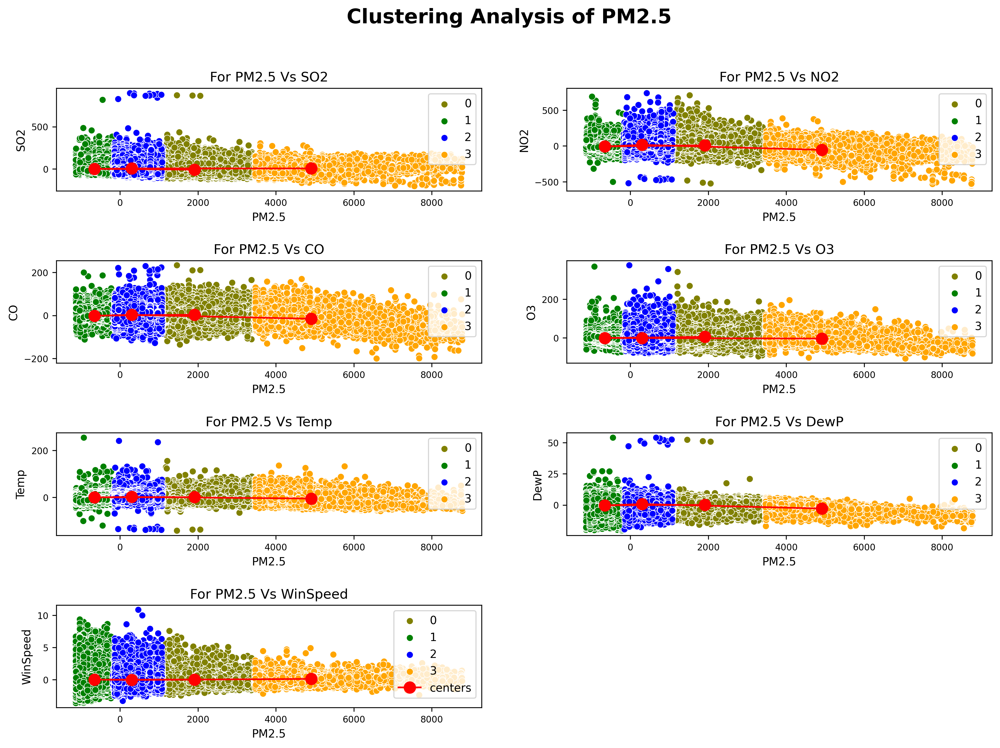

In [136]:
plt.figure(dpi= 300, figsize=(15,10))

plt.subplot(421)
sns.scatterplot(red_df[red_df['Category']==0]['PM2.5'], red_df[red_df['Category']==0]['SO2'], label= '0', color= 'olive')
sns.scatterplot(red_df[red_df['Category']==1]['PM2.5'], red_df[red_df['Category']==1]['SO2'], label= '1', color= 'green')
sns.scatterplot(red_df[red_df['Category']==2]['PM2.5'], red_df[red_df['Category']==2]['SO2'], label= '2', color= 'blue')
sns.scatterplot(red_df[red_df['Category']==3]['PM2.5'], red_df[red_df['Category']==3]['SO2'], label= '3', color= 'orange')
plt.plot(centroids[:, 0], centroids[:, 1], marker="o", markersize=10, color= 'red', label= 'centers')
plt.xticks(fontsize=8) 
plt.yticks(fontsize=8) 
plt.xlabel('PM2.5', fontsize=10)
plt.ylabel('SO2', fontsize=10)
plt.title('For PM2.5 Vs SO2')

plt.subplot(422)
sns.scatterplot(red_df[red_df['Category']==0]['PM2.5'], red_df[red_df['Category']==0]['NO2'], label= '0', color= 'olive')
sns.scatterplot(red_df[red_df['Category']==1]['PM2.5'], red_df[red_df['Category']==1]['NO2'], label= '1', color= 'green')
sns.scatterplot(red_df[red_df['Category']==2]['PM2.5'], red_df[red_df['Category']==2]['NO2'], label= '2', color= 'blue')
sns.scatterplot(red_df[red_df['Category']==3]['PM2.5'], red_df[red_df['Category']==3]['NO2'], label= '3', color= 'orange')
plt.plot(centroids[:, 0], centroids[:, 2], marker="o", markersize=10, color= 'red', label= 'centers')
plt.xticks(fontsize=8) 
plt.yticks(fontsize=8) 
plt.xlabel('PM2.5', fontsize=10)
plt.ylabel('NO2', fontsize=10)
plt.title('For PM2.5 Vs NO2')

plt.subplot(423)
sns.scatterplot(red_df[red_df['Category']==0]['PM2.5'], red_df[red_df['Category']==0]['CO'], label= '0', color= 'olive')
sns.scatterplot(red_df[red_df['Category']==1]['PM2.5'], red_df[red_df['Category']==1]['CO'], label= '1', color= 'green')
sns.scatterplot(red_df[red_df['Category']==2]['PM2.5'], red_df[red_df['Category']==2]['CO'], label= '2', color= 'blue')
sns.scatterplot(red_df[red_df['Category']==3]['PM2.5'], red_df[red_df['Category']==3]['CO'], label= '3', color= 'orange')
plt.plot(centroids[:, 0], centroids[:, 3], marker="o", markersize=10, color= 'red', label= 'centers')
plt.xticks(fontsize=8) 
plt.yticks(fontsize=8) 
plt.xlabel('PM2.5', fontsize=10)
plt.ylabel('CO', fontsize=10)
plt.title('For PM2.5 Vs CO')

plt.subplot(424)
sns.scatterplot(red_df[red_df['Category']==0]['PM2.5'], red_df[red_df['Category']==0]['O3'], label= '0', color= 'olive')
sns.scatterplot(red_df[red_df['Category']==1]['PM2.5'], red_df[red_df['Category']==1]['O3'], label= '1', color= 'green')
sns.scatterplot(red_df[red_df['Category']==2]['PM2.5'], red_df[red_df['Category']==2]['O3'], label= '2', color= 'blue')
sns.scatterplot(red_df[red_df['Category']==3]['PM2.5'], red_df[red_df['Category']==3]['O3'], label= '3', color= 'orange')
plt.plot(centroids[:, 0], centroids[:, 4], marker="o", markersize=10, color= 'red', label= 'centers')
plt.xticks(fontsize=8) 
plt.yticks(fontsize=8) 
plt.xlabel('PM2.5', fontsize=10)
plt.ylabel('O3', fontsize=10)
plt.title('For PM2.5 Vs O3')

plt.subplot(425)
sns.scatterplot(red_df[red_df['Category']==0]['PM2.5'], red_df[red_df['Category']==0]['Temp'], label= '0', color= 'olive')
sns.scatterplot(red_df[red_df['Category']==1]['PM2.5'], red_df[red_df['Category']==1]['Temp'], label= '1', color= 'green')
sns.scatterplot(red_df[red_df['Category']==2]['PM2.5'], red_df[red_df['Category']==2]['Temp'], label= '2', color= 'blue')
sns.scatterplot(red_df[red_df['Category']==3]['PM2.5'], red_df[red_df['Category']==3]['Temp'], label= '3', color= 'orange')
plt.plot(centroids[:, 0], centroids[:, 5], marker="o", markersize=10, color= 'red', label= 'centers')
plt.xticks(fontsize=8) 
plt.yticks(fontsize=8) 
plt.xlabel('PM2.5', fontsize=10)
plt.ylabel('Temp', fontsize=10)
plt.title('For PM2.5 Vs Temp')


plt.subplot(426)
sns.scatterplot(red_df[red_df['Category']==0]['PM2.5'], red_df[red_df['Category']==0]['DewP'], label= '0', color= 'olive')
sns.scatterplot(red_df[red_df['Category']==1]['PM2.5'], red_df[red_df['Category']==1]['DewP'], label= '1', color= 'green')
sns.scatterplot(red_df[red_df['Category']==2]['PM2.5'], red_df[red_df['Category']==2]['DewP'], label= '2', color= 'blue')
sns.scatterplot(red_df[red_df['Category']==3]['PM2.5'], red_df[red_df['Category']==3]['DewP'], label= '3', color= 'orange')
plt.plot(centroids[:, 0], centroids[:, 6], marker="o", markersize=10, color= 'red', label= 'centers')
plt.xticks(fontsize=8) 
plt.yticks(fontsize=8) 
plt.xlabel('PM2.5', fontsize=10)
plt.ylabel('DewP', fontsize=10)
plt.title('For PM2.5 Vs DewP')

plt.subplot(427)
sns.scatterplot(red_df[red_df['Category']==0]['PM2.5'], red_df[red_df['Category']==0]['WinSpeed'], label= '0', color= 'olive')
sns.scatterplot(red_df[red_df['Category']==1]['PM2.5'], red_df[red_df['Category']==1]['WinSpeed'], label= '1', color= 'green')
sns.scatterplot(red_df[red_df['Category']==2]['PM2.5'], red_df[red_df['Category']==2]['WinSpeed'], label= '2', color= 'blue')
sns.scatterplot(red_df[red_df['Category']==3]['PM2.5'], red_df[red_df['Category']==3]['WinSpeed'], label= '3', color= 'orange')
plt.plot(centroids[:, 0], centroids[:, 7], marker="o", markersize=10, color= 'red', label= 'centers')
plt.xticks(fontsize=8) 
plt.yticks(fontsize=8) 
plt.xlabel('PM2.5', fontsize=10)
plt.ylabel('WinSpeed', fontsize=10)
plt.title('For PM2.5 Vs WinSpeed')

plt.subplots_adjust(hspace=0.68)
plt.suptitle("Clustering Analysis of PM2.5", fontsize= 18, fontweight= 'bold')
plt.legend()
plt.show()

#### Clustering for PM10

##### Elbow Method to find out the optimal number of clusters

In [8]:
x2= df_new_2.iloc[:, :].values
wcs2=[]

for i in range(1,25):
    model= KMeans(n_clusters=i, init='k-means++' ).fit(x2)
    wcs2.append(model.inertia_)

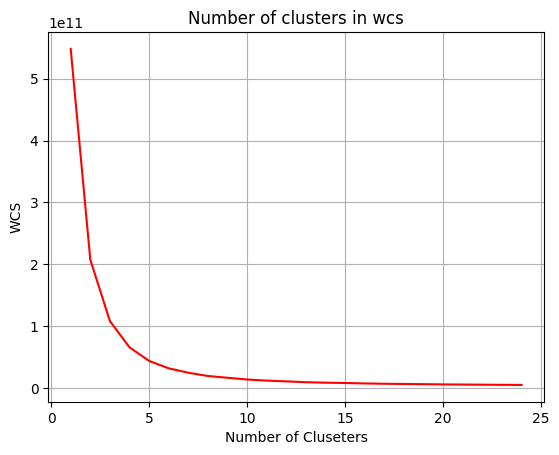

In [9]:
plt.plot(range(1,25), wcs2, color='r')
plt.title("Number of clusters in wcs")
plt.xlabel("Number of Cluseters")
plt.ylabel("WCS")
plt.grid()
plt.show()

##### PCA Implementation

In [132]:
pca= PCA()
red_arr2= pca.fit_transform(df_new_2)

##### Model Training

In [133]:
kmeans2 = KMeans(n_clusters=4, random_state=0).fit(red_arr2)
centroids2= kmeans2.cluster_centers_
print(centroids2)

[[ 1.88927456e+03 -1.90689510e+00 -1.33371654e+01  3.73080867e+00
   5.54852579e+00  5.23780923e-01  1.58504805e-01  2.56662973e-02]
 [-6.55810132e+02 -5.05864569e+00  4.97977977e+00 -1.76702718e+00
  -2.33743583e-01 -7.49206394e-01 -3.63048260e-01  1.38250642e-02]
 [ 4.80987823e+03 -2.86750392e+01  4.05969664e+01 -1.67910377e+01
  -1.67720335e+00 -5.90926232e+00 -2.97239884e+00  1.13441363e-01]
 [ 3.01262337e+02  1.25040987e+01 -8.47094057e+00  3.50197540e+00
  -1.16601159e+00  1.72512176e+00  8.74176876e-01 -4.32664889e-02]]


In [134]:
red_df2 = pd.DataFrame(red_arr2, columns=['PM10', 'SO2', 'NO2', 'CO', 'O3', 'Temp', 'DewP', 'WinSpeed'])
red_df2['Category']= kmeans.labels_
red_df2.head()

,PM10,SO2,NO2,CO,O3,Temp,DewP,WinSpeed,Category
0,-938.491383,-49.452668,19.842613,-13.155438,20.631160,-18.350370,2.311377,1.651950,1
1,-938.269656,-45.632010,18.877473,-13.840022,20.615589,-18.173090,2.942487,2.017038,1
2,-938.189980,-47.339143,14.607696,-11.507020,20.276509,-17.783623,2.679702,2.954980,1
3,-938.145719,-48.288314,13.343524,-8.148914,24.967127,-15.635113,2.615950,0.429103,1
4,-938.277895,-51.044294,13.705118,-6.367355,25.464622,-15.638396,3.194765,-0.610061,1


##### Plot of PM10

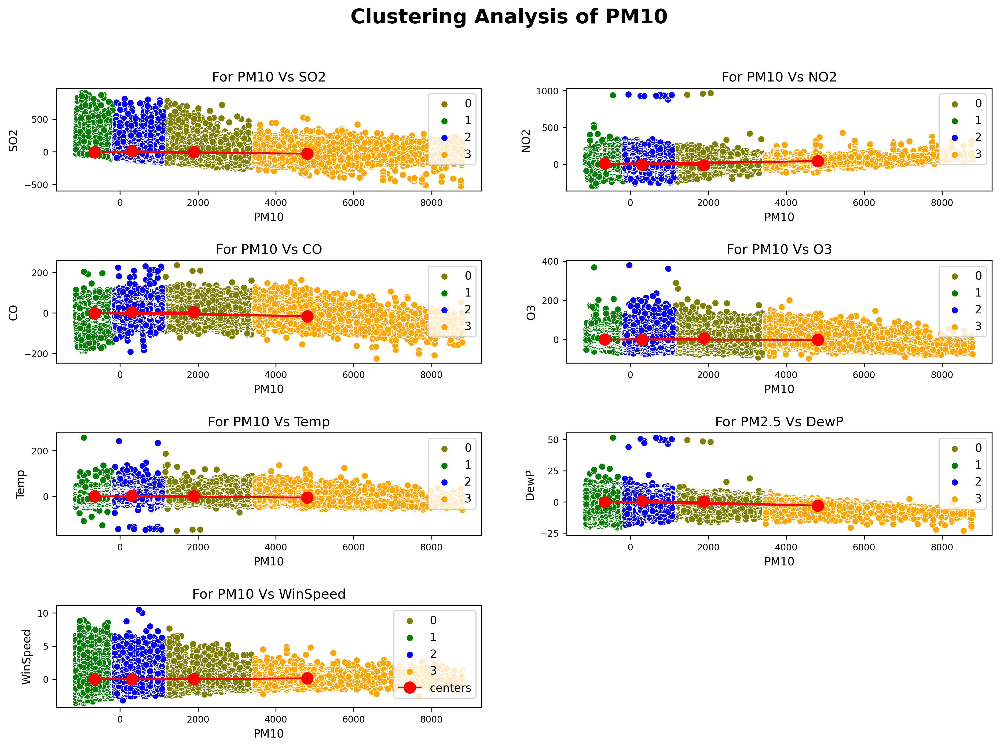

In [137]:
plt.figure(dpi= 300, figsize=(15,10))

plt.subplot(421)
sns.scatterplot(red_df2[red_df2['Category']==0]['PM10'], red_df2[red_df2['Category']==0]['SO2'], label= '0', color= 'olive')
sns.scatterplot(red_df2[red_df2['Category']==1]['PM10'], red_df2[red_df2['Category']==1]['SO2'], label= '1', color= 'green')
sns.scatterplot(red_df2[red_df2['Category']==2]['PM10'], red_df2[red_df2['Category']==2]['SO2'], label= '2', color= 'blue')
sns.scatterplot(red_df2[red_df2['Category']==3]['PM10'], red_df2[red_df2['Category']==3]['SO2'], label= '3', color= 'orange')
plt.plot(centroids2[:, 0], centroids2[:, 1], marker="o", markersize=10, color= 'red', label= 'centers')
plt.xticks(fontsize=8) 
plt.yticks(fontsize=8) 
plt.xlabel('PM10', fontsize=10)
plt.ylabel('SO2', fontsize=10)
plt.title('For PM10 Vs SO2')

plt.subplot(422)
sns.scatterplot(red_df2[red_df2['Category']==0]['PM10'], red_df2[red_df2['Category']==0]['NO2'], label= '0', color= 'olive')
sns.scatterplot(red_df2[red_df2['Category']==1]['PM10'], red_df2[red_df2['Category']==1]['NO2'], label= '1', color= 'green')
sns.scatterplot(red_df2[red_df2['Category']==2]['PM10'], red_df2[red_df2['Category']==2]['NO2'], label= '2', color= 'blue')
sns.scatterplot(red_df2[red_df2['Category']==3]['PM10'], red_df2[red_df2['Category']==3]['NO2'], label= '3', color= 'orange')
plt.plot(centroids2[:, 0], centroids2[:, 2], marker="o", markersize=10, color= 'red', label= 'centers')
plt.xticks(fontsize=8) 
plt.yticks(fontsize=8) 
plt.xlabel('PM10', fontsize=10)
plt.ylabel('NO2', fontsize=10)
plt.title('For PM10 Vs NO2')

plt.subplot(423)
sns.scatterplot(red_df2[red_df2['Category']==0]['PM10'], red_df2[red_df2['Category']==0]['CO'], label= '0', color= 'olive')
sns.scatterplot(red_df2[red_df2['Category']==1]['PM10'], red_df2[red_df2['Category']==1]['CO'], label= '1', color= 'green')
sns.scatterplot(red_df2[red_df2['Category']==2]['PM10'], red_df2[red_df2['Category']==2]['CO'], label= '2', color= 'blue')
sns.scatterplot(red_df2[red_df2['Category']==3]['PM10'], red_df2[red_df2['Category']==3]['CO'], label= '3', color= 'orange')
plt.plot(centroids2[:, 0], centroids2[:, 3], marker="o", markersize=10, color= 'red', label= 'centers')
plt.xticks(fontsize=8) 
plt.yticks(fontsize=8) 
plt.xlabel('PM10', fontsize=10)
plt.ylabel('CO', fontsize=10)
plt.title('For PM10 Vs CO')

plt.subplot(424)
sns.scatterplot(red_df2[red_df2['Category']==0]['PM10'], red_df2[red_df2['Category']==0]['O3'], label= '0', color= 'olive')
sns.scatterplot(red_df2[red_df2['Category']==1]['PM10'], red_df2[red_df2['Category']==1]['O3'], label= '1', color= 'green')
sns.scatterplot(red_df2[red_df2['Category']==2]['PM10'], red_df2[red_df2['Category']==2]['O3'], label= '2', color= 'blue')
sns.scatterplot(red_df2[red_df2['Category']==3]['PM10'], red_df2[red_df2['Category']==3]['O3'], label= '3', color= 'orange')
plt.plot(centroids2[:, 0], centroids2[:, 4], marker="o", markersize=10, color= 'red', label= 'centers')
plt.xticks(fontsize=8) 
plt.yticks(fontsize=8) 
plt.xlabel('PM10', fontsize=10)
plt.ylabel('O3', fontsize=10)
plt.title('For PM10 Vs O3')

plt.subplot(425)
sns.scatterplot(red_df2[red_df2['Category']==0]['PM10'], red_df2[red_df2['Category']==0]['Temp'], label= '0', color= 'olive')
sns.scatterplot(red_df2[red_df2['Category']==1]['PM10'], red_df2[red_df2['Category']==1]['Temp'], label= '1', color= 'green')
sns.scatterplot(red_df2[red_df2['Category']==2]['PM10'], red_df2[red_df2['Category']==2]['Temp'], label= '2', color= 'blue')
sns.scatterplot(red_df2[red_df2['Category']==3]['PM10'], red_df2[red_df2['Category']==3]['Temp'], label= '3', color= 'orange')
plt.plot(centroids2[:, 0], centroids2[:, 5], marker="o", markersize=10, color= 'red', label= 'centers')
plt.xticks(fontsize=8) 
plt.yticks(fontsize=8) 
plt.xlabel('PM10', fontsize=10)
plt.ylabel('Temp', fontsize=10)
plt.title('For PM10 Vs Temp')


plt.subplot(426)
sns.scatterplot(red_df2[red_df2['Category']==0]['PM10'], red_df2[red_df2['Category']==0]['DewP'], label= '0', color= 'olive')
sns.scatterplot(red_df2[red_df2['Category']==1]['PM10'], red_df2[red_df2['Category']==1]['DewP'], label= '1', color= 'green')
sns.scatterplot(red_df2[red_df2['Category']==2]['PM10'], red_df2[red_df2['Category']==2]['DewP'], label= '2', color= 'blue')
sns.scatterplot(red_df2[red_df2['Category']==3]['PM10'], red_df2[red_df2['Category']==3]['DewP'], label= '3', color= 'orange')
plt.plot(centroids2[:, 0], centroids2[:, 6], marker="o", markersize=10, color= 'red', label= 'centers')
plt.xticks(fontsize=8) 
plt.yticks(fontsize=8) 
plt.xlabel('PM10', fontsize=10)
plt.ylabel('DewP', fontsize=10)
plt.title('For PM2.5 Vs DewP')

plt.subplot(427)
sns.scatterplot(red_df2[red_df2['Category']==0]['PM10'], red_df2[red_df2['Category']==0]['WinSpeed'], label= '0', color= 'olive')
sns.scatterplot(red_df2[red_df2['Category']==1]['PM10'], red_df2[red_df2['Category']==1]['WinSpeed'], label= '1', color= 'green')
sns.scatterplot(red_df2[red_df2['Category']==2]['PM10'], red_df2[red_df2['Category']==2]['WinSpeed'], label= '2', color= 'blue')
sns.scatterplot(red_df2[red_df2['Category']==3]['PM10'], red_df2[red_df2['Category']==3]['WinSpeed'], label= '3', color= 'orange')
plt.plot(centroids2[:, 0], centroids2[:, 7], marker="o", markersize=10, color= 'red', label= 'centers')
plt.xticks(fontsize=8) 
plt.yticks(fontsize=8) 
plt.xlabel('PM10', fontsize=10)
plt.ylabel('WinSpeed', fontsize=10)
plt.title('For PM10 Vs WinSpeed')

plt.subplots_adjust(hspace=0.68)
plt.suptitle("Clustering Analysis of PM10", fontsize= 18, fontweight= 'bold')
plt.legend()
plt.show()

### Hypothesis Testing

In [2]:
# Hypothesis testing to study the difference between two sites in the city


In [136]:
df= clean_data.copy()
df.head()

,Year,Month,Day,Hour,PM2.5,PM10,SO2,NO2,CO,O3,Temp,Press,DewP,Rain,WinDir,WinSpeed,Station
0,2013,3,1,0,4.0,4.0,4.0,7.0,300.0,77.0,-0.7,1023.0,-18.8,0.0,NNW,4.4,Aotizhongxin
1,2013,3,1,1,8.0,8.0,4.0,7.0,300.0,77.0,-1.1,1023.2,-18.2,0.0,N,4.7,Aotizhongxin
2,2013,3,1,2,7.0,7.0,5.0,10.0,300.0,73.0,-1.1,1023.5,-18.2,0.0,NNW,5.6,Aotizhongxin
3,2013,3,1,3,6.0,6.0,11.0,11.0,300.0,72.0,-1.4,1024.5,-19.4,0.0,NW,3.1,Aotizhongxin
4,2013,3,1,4,3.0,3.0,12.0,12.0,300.0,72.0,-2.0,1025.2,-19.5,0.0,N,2.0,Aotizhongxin


In [3]:
df.Station.unique()

array(['Aotizhongxin', 'Changping', 'Dingling', 'Dongsi', 'Guanyuan',
       'Gucheng', 'Huairou', 'Nongzhanguan', 'Shunyi', 'Tiantan',
       'Wanliu', 'Wanshouxigong'], dtype=object)

In [4]:
print('The mean of PM2.5 of Aotizhongxin site is ', np.mean(df[df['Station']=='Aotizhongxin']['PM2.5']))
print('The mean of PM2.5 of Aotizhongxin site is ', np.mean(df[df['Station']=='Aotizhongxin']['PM10']))


The mean of PM2.5 of Aotizhongxin site is  82.43833247775495
The mean of PM2.5 of Aotizhongxin site is  109.9002535363906


In [9]:
np.mean(df['PM2.5'])

79.74122996520647

##### Normalization

array([[<AxesSubplot:title={'center':'PM2.5'}>,
        <AxesSubplot:title={'center':'PM10'}>],
       [<AxesSubplot:title={'center':'SO2'}>,
        <AxesSubplot:title={'center':'NO2'}>],
       [<AxesSubplot:title={'center':'CO'}>,
        <AxesSubplot:title={'center':'O3'}>]], dtype=object)

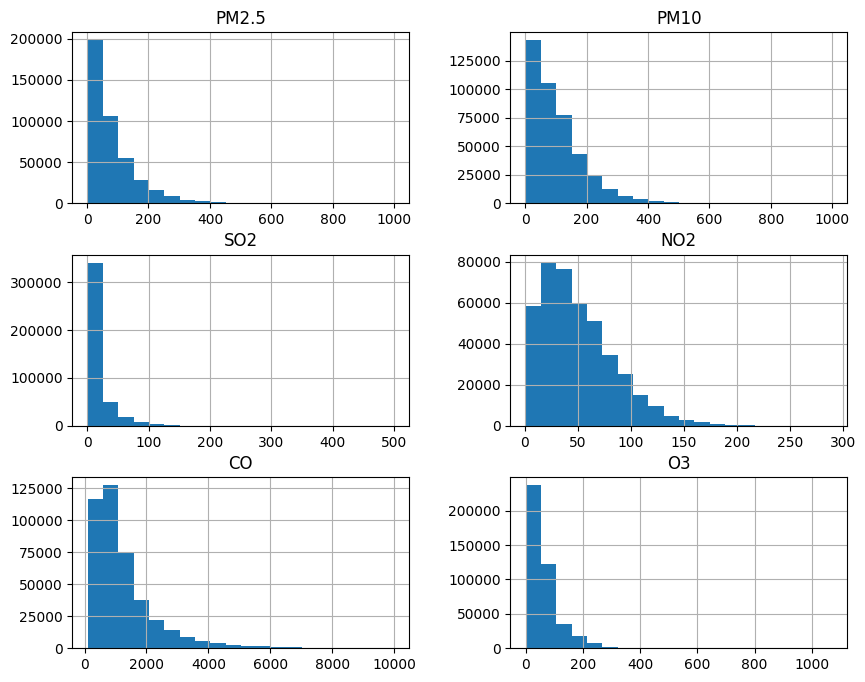

In [11]:
df[['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3']].hist(bins=20, figsize=(10,8))

It shows the data is not normalized. They are highly skewed. So we use powertransformer to rescale them

In [5]:
from sklearn import preprocessing

pt = preprocessing.PowerTransformer(method='box-cox', standardize=False)
log_scale = pt.fit_transform(df[['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3']])
log_scale = pd.DataFrame(log_scale, columns=['PM2.5', 'PM10', 'SO2', 'NO2', 'CO', 'O3'])


array([[<AxesSubplot:title={'center':'PM2.5'}>,
        <AxesSubplot:title={'center':'PM10'}>],
       [<AxesSubplot:title={'center':'SO2'}>,
        <AxesSubplot:title={'center':'NO2'}>],
       [<AxesSubplot:title={'center':'CO'}>,
        <AxesSubplot:title={'center':'O3'}>]], dtype=object)

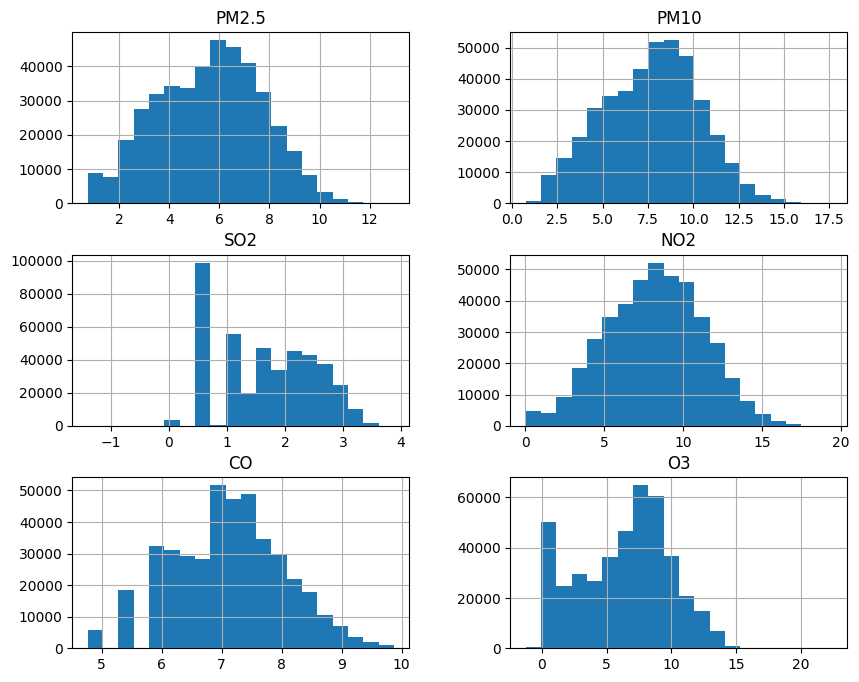

In [141]:
log_scale.hist(bins=20, figsize=(10,8))

It is somewhat is normalized. We proceed with this data for hypothesis testing

In [6]:
log_scale['Station']= df["Station"]

##### Hypothesis Testing

Since our data is almost is normalized, hence we use T- distribution

We will do hypothesis testing on

H0: Mean of (PM2.5 or PM10) of x-site is equal to y-site

H1: Mean of (PM2.5 or PM10) of x-site is not equal to y-site

Procedure:

1. First unique elements are extracted.
2. Their sample sizes are stored ie. n1 and n2.
3. The sample means of the samples i.e mean1 and mean2 are computed from the unique data sample. 
4. Their variances are computed from the unique data sample.
5. Based on 95% CI, interval is calculated ie. T.Inv.2RT(0.05, min[n1, n2]). The formula is CI= (mean1-mean2) (+/-) T_val*sqrt(var1/n1 +var2/n2)
6. If the interval includes zero then null hypothesis is accepted otherwise rejected.

In [37]:
import scipy.stats

In [130]:
# Sample sizes of the sites
def testing(city1, city2, against):

    n1= log_scale[log_scale['Station']==city1][against].unique().shape[0]
    n2= log_scale[log_scale['Station']==city2][against].unique().shape[0]
    
    # Mean values of the sites
    mean1= np.mean(log_scale[log_scale['Station']==city1][against].unique())
    mean2= np.mean(log_scale[log_scale['Station']==city2][against].unique())
    
    # Sample variances of the sites
    V1= np.var(log_scale[log_scale['Station']==city1][against].unique())
    V2= np.var(log_scale[log_scale['Station']==city2][against].unique())
    
    t_computed= np.abs(mean1-mean2)/np.sqrt(V1/n1 + V2/n2)
    

    # for 95% Confidence Interval and 7 degree of freedom, T-value(0.05, 7). We have
    
    T_upper = scipy.stats.t.ppf(q=1-.05/2,df=np.min([n1,n2]))

    CI_min= np.abs(mean1-mean2) - T_upper*(np.sqrt(V1/n1 + V2/n2))
    CI_max= np.abs(mean1-mean2) + T_upper*(np.sqrt(V1/n1 + V2/n2))

    '''
    print("The sample data is of {} and {} sites".format(city1, city2))
    print("\n\nThe size of {} and {} is {} and {} respectively. ".format(city1, city2, n1, n2))
 
    print("\nThe mean of {} and {} is {:.4f} and {:.4f} respectively.".format(city1, city2, mean1, mean2))

    print("\nThe variance of {} and {} is {:.4f} and {:.4f} respectively.".format(city1, city2, V1, V2))
    
    print("\nFor 95% CI, the T(alpha= 0.05/2) with df={} is {:.4f}".format(np.min([n1,n2]), T_upper))
    
    print("\nThe computed statistical t-value of testing is {:.4f}".format(t_computed))
    
    print('\nThe confidence interval is [{:.4f}, {:.4f}]'.format(CI_min, CI_max))
    '''

    print('[{}, {}]--->[{:.4f}, {:.4f}]'.format(city1, city2, CI_min, CI_max))
    
    if (CI_min>0 or CI_max<0) :
        print('Since the interval does not include, hence it fails to accept null hypothesis.\n')
    else:
        print("Since the interval includes 0, hence it accepts null hypothesis.\n")

In [89]:
cities= log_scale.Station.unique()

##### Hypothesis testing for PM2.5

In [132]:
for i in range(len(cities)):
    for j in range(i+1, len(cities)):
        testing(cities[i], cities[j],'PM2.5')


[Aotizhongxin, Changping]--->[0.0619, 0.5593]
Since the interval does not include, hence it fails to accept null hypothesis.

[Aotizhongxin, Dingling]--->[0.1449, 0.6479]
Since the interval does not include, hence it fails to accept null hypothesis.

[Aotizhongxin, Dongsi]--->[-0.1373, 0.3510]
Since the interval includes 0, hence it accepts null hypothesis.

[Aotizhongxin, Guanyuan]--->[-0.2132, 0.2738]
Since the interval includes 0, hence it accepts null hypothesis.

[Aotizhongxin, Gucheng]--->[-0.1570, 0.3320]
Since the interval includes 0, hence it accepts null hypothesis.

[Aotizhongxin, Huairou]--->[0.1110, 0.6071]
Since the interval does not include, hence it fails to accept null hypothesis.

[Aotizhongxin, Nongzhanguan]--->[-0.1632, 0.3242]
Since the interval includes 0, hence it accepts null hypothesis.

[Aotizhongxin, Shunyi]--->[-0.2367, 0.2552]
Since the interval includes 0, hence it accepts null hypothesis.

[Aotizhongxin, Tiantan]--->[-0.2240, 0.2633]
Since the interval in

##### Hypothesis testing for PM10

In [133]:
for i in range(len(cities)):
    for j in range(i+1, len(cities)):
        testing(cities[i], cities[j],'PM10')


[Aotizhongxin, Changping]--->[-0.0906, 0.6115]
Since the interval includes 0, hence it accepts null hypothesis.

[Aotizhongxin, Dingling]--->[0.2796, 0.9908]
Since the interval does not include, hence it fails to accept null hypothesis.

[Aotizhongxin, Dongsi]--->[-0.1014, 0.5836]
Since the interval includes 0, hence it accepts null hypothesis.

[Aotizhongxin, Guanyuan]--->[-0.3275, 0.3604]
Since the interval includes 0, hence it accepts null hypothesis.

[Aotizhongxin, Gucheng]--->[-0.1447, 0.5415]
Since the interval includes 0, hence it accepts null hypothesis.

[Aotizhongxin, Huairou]--->[0.1352, 0.8370]
Since the interval does not include, hence it fails to accept null hypothesis.

[Aotizhongxin, Nongzhanguan]--->[-0.3275, 0.3581]
Since the interval includes 0, hence it accepts null hypothesis.

[Aotizhongxin, Shunyi]--->[-0.0564, 0.6404]
Since the interval includes 0, hence it accepts null hypothesis.

[Aotizhongxin, Tiantan]--->[-0.1653, 0.5230]
Since the interval includes 0, hen

#### End